In [1]:
import io
import os
import numpy as np
import pandas as pd
import gzip as gz
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker
from matplotlib_venn import venn2, venn3

sns.set_theme(font="Arial", font_scale=1.15, style='ticks') 
matplotlib.rcParams['figure.dpi'] = 300
plt.rc("axes.spines", top=True, right=True)

def read_vcf(path):
    if path[-3:] == ".gz": 
        with gz.open(path, 'rb') as f:
            lines = [l.decode('utf-8') for l in f if not l.startswith(b'##')]
            return pd.read_csv(
                io.StringIO(''.join(lines)),
                dtype={'#CHROM': str, 'POS': int, 'ID': str, 'REF': str, 'ALT': str,
                       'QUAL': str, 'FILTER': str, 'INFO': str},
                       sep='\t'
                       ).rename(columns={'#CHROM': 'CHROM'})
    else:
        with open(path, 'r') as f:
            lines = [l for l in f if not l.startswith('##')]
            return pd.read_csv(
                io.StringIO(''.join(lines)),
                dtype={'#CHROM': str, 'POS': int, 'ID': str, 'REF': str, 'ALT': str,
                       'QUAL': str, 'FILTER': str, 'INFO': str},
                       sep='\t'
                       ).rename(columns={'#CHROM': 'CHROM'})

def vcf_format_getter(df, field) -> pd.Series:
    """
    Parameters
    ----------
    
    df : pandas.core.frame.DataFrame
        vcf read through read_vcf()
    field : str
        GT, VAF, DP, AD
    
    return pd.Series

    Example vcf structure
    ----------
    FORMAT              COLO829T_PassageB_DSA  
    GT:GQ:DP:AD:VAF:PL  1/1:59:133:2,131:0.984962:65,60,0
    GT:GQ:DP:AD:VAF:PL  1/1:65:131:0,131:1:70,66,0
    GT:GQ:DP:AD:VAF:PL  1/1:53:49:0,49:1:58,54,0

    """
    sampleid = df.columns[9]
    format = list(set(df['FORMAT'].values))[0].split(':')

    if field == "GT":
        gtindex = format.index('GT')
        return df[sampleid].str.split(':').apply(lambda x: x[gtindex])
    
    elif field == "VAF":
        vafindex = format.index('VAF')
        return df[sampleid].str.split(':').apply(lambda x: float(x[vafindex]))
    
    elif field == "DP":
        dpindex = format.index('DP')
        return df[sampleid].str.split(':').apply(lambda x: int(x[dpindex]))
    
    elif field == "AD":
        adindex = format.index('AD')
        return df[sampleid].str.split(':').apply(lambda x: int(x[adindex].split(',')[1]))
    
    else:
        raise ValueError("field should be one of GT, VAF, DP and AD!")

def vcf_info_parser(info_string) -> dict:
    """
    Parameters
    ----------
    info_string : str
    SP=STK,RF,MT2,VN;RGN=Difficult;RGN_T=Tier2;VAF_Ill=0.965;VAF_PB=1

    return dict

    """
    return {i.split('=')[0]: i.split('=')[1] for i in info_string.split(';')}

def vcf_info_getter(df, field):
    """
    Parameters
    ----------
    
    df : pandas.core.frame.DataFrame
        vcf read through read_vcf()
    field : str
        VAF_Ill, VAF_PB
    
    return pd.Series

    Example vcf structure
    ----------
    INFO
    SP=STK,RF,MT2,VN;RGN=Difficult;RGN_T=Tier2;VAF_Ill=0.965;VAF_PB=1
    SP=STK,RF,MT2,VN;RGN=Easy;RGN_T=Tier0;VAF_Ill=0.981;VAF_PB=0.984
    """

    if field == "RGN":
        return df['INFO'].apply(lambda x: vcf_info_parser(x)[field])
    
    elif field == "RGN_T":
        return df['INFO'].apply(lambda x: vcf_info_parser(x)[field])
    
    elif field == "VAF_Ill" or field == "VAF_PB":
        return df['INFO'].apply(lambda x: float(vcf_info_parser(x)[field]) if vcf_info_parser(x)[field] != 'NA' else np.nan)

    else:
        raise ValueError("field should be one of RGN, RGN_T, VAF_Ill and VAF_PB!")

def make_site_list(df: pd.DataFrame, path: str, prefix: str) -> None:
    """
    Parameters
    ----------
    df : pandas.core.frame.DataFrame 
        vcf read through read_vcf()
    path : str

    prefix : str

    return target_list 
    """
    
    df = df[['CHROM', 'POS', 'POS']].drop_duplicates()
    
    df.to_csv(f"{os.path.join(path, prefix)}.sitelist", sep='\t', index=False, header=False)

def get_pileup_nonref_snvid_from_bamreadcount(string):
	"""
    Parameters
    ----------
    haplotype1-0000001      33514324        C       163     =:0:0.00:0.00:0.00:0:0:0.00:0.00:0.00:0:0.00:0.00:0.00  A:0:0.00:0.00:0.00:0:0:0.00:0.00:0.00:0:0.00:0.00:0.00  C:163:60.00:37.20:60.00:77:86:0.45:0.00:85.27:77:0.52:21136.30:0.50     G:0:0.00:0.00:0.00:0:0:0.00:0.00:0.00:0:0.00:0.00:0.00  T:0:0.00:0.00:0.00:0:0:0.00:0.00:0.00:0:0.00:0.00:0.00  N:0:0.00:0.00:0.00:0:0:0.00:0.00:0.00:0:0.00:0.00:0.00  +A:1:60.00:0.00:60.00:0:1:0.38:0.01:268.00:0:0.00:23061.00:0.81
    """
	threshold = 1
	
	string2list = string.strip().split()
	preid = f"{'_'.join(string2list[:3])}_"
	
	snvid_list = list()
	
	for s in string2list[5:9]:
		s = s.split(':')
		if s[0] != string2list[2] and int(s[1]) >= threshold:
			snvid_list.append(preid + s[0])
	
	return snvid_list

dir="/mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/Fiber-seq"
#dir="/Users/mhryansohn/Desktop/01.Workspace/02.Institution/04.UW/Variant_Truset"

DSA="/mmfs1/gscratch/stergachislab/mhsohny/SMaHT/DSA/DSA_COLO829BL_v3.0.0.fasta"

## Read through DeepVariant VCFs (for COLO829BL, T Passage B and T Passage A aligned and called based on DSAv3.0.0)

In [2]:
'''
colobl_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829BL/deepvariant/COLO829BL.deepvariant.vcf.gz")
colotb_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.vcf.gz")
colota_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.vcf.gz")
'''
colobl_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829BL/deepvariant/COLO829BL.deepvariant.split.snv.modified.vcf.gz")
colotb_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.vcf.gz")
colota_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.vcf.gz")

## DSAv3.0.0 Flagger/NucFreq Results (for each variants)

### These should be generalized (below are currently not the flgger/nucfreq regions but merely the variant ids overlapped with them)

In [3]:
colobl_flagger = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829BL/deepvariant/COLO829BL.deepvariant.split.snv.modified.flagger", sep='\t', header=None)
colobl_flagger.columns = ['SNVid', 'FILTER', 'Flagger']
colotb_flagger = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flagger", sep='\t', header=None)
colotb_flagger.columns = ['SNVid', 'FILTER', 'Flagger']
colota_flagger = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flagger", sep='\t', header=None)
colota_flagger.columns = ['SNVid', 'FILTER', 'Flagger']

colobl_nucfreq = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829BL/deepvariant/COLO829BL.deepvariant.split.snv.modified.nucfreq", sep='\t', header=None)
colobl_nucfreq.columns = ['SNVid', 'FILTER', 'NucFreq']
colotb_nucfreq = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.nucfreq", sep='\t', header=None)
colotb_nucfreq.columns = ['SNVid', 'FILTER', 'NucFreq']
colota_nucfreq = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.nucfreq", sep='\t', header=None)
colota_nucfreq.columns = ['SNVid', 'FILTER', 'NucFreq']

## Simple Stats

In [4]:
colobl_median_dp = 178
colotb_median_dp = 120
colota_median_dp = 52

In [5]:
'''
print(f"COLO829BL PASS variants from all tested alleles: {round(colobl_vcf[colobl_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colobl_vcf.index.shape[0], 2)} %")
print(f"COLO829BL PASS SNVs from all tested SNV alleles: {round(colobl_vcf[(colobl_vcf['FILTER'] == 'PASS') & (colobl_vcf['REF'].str.len() == 1) & (colobl_vcf['ALT'].str.len() == 1)].index.shape[0]*100 / colobl_vcf[((colobl_vcf['REF']).str.len() ==1) & (colobl_vcf['ALT'].str.len()==1)].index.shape[0], 2)} %")

print(f"COLO829T (Passage B) PASS variants from all tested alleles: {round(colotb_vcf[colotb_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colotb_vcf.index.shape[0], 2)} %")
print(f"COLO829T (Passage B) PASS SNVs from all tested SNV alleles: {round(colotb_vcf[(colotb_vcf['FILTER'] == 'PASS') & (colotb_vcf['REF'].str.len() == 1) & (colotb_vcf['ALT'].str.len() == 1)].index.shape[0]*100 / colotb_vcf[((colotb_vcf['REF']).str.len() ==1) & (colotb_vcf['ALT'].str.len()==1)].index.shape[0], 2)} %")

print(f"COLO829T (Passage A) PASS variants from all tested alleles: {round(colota_vcf[colota_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colota_vcf.index.shape[0], 2)} %")
print(f"COLO829T (Passage A) PASS SNVs from all tested SNV alleles: {round(colota_vcf[(colota_vcf['FILTER'] == 'PASS') & (colota_vcf['REF'].str.len() == 1) & (colota_vcf['ALT'].str.len() == 1)].index.shape[0]*100 / colota_vcf[((colota_vcf['REF']).str.len() ==1) & (colota_vcf['ALT'].str.len()==1)].index.shape[0], 2)} %")
'''
print(f"COLO829BL PASS SNVs from all tested SNV alleles: {round(colobl_vcf[colobl_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colobl_vcf.index.shape[0], 2)} %")
print(f"COLO829T (Passage B) PASS SNVs from all tested SNV alleles: {round(colotb_vcf[colotb_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colotb_vcf.index.shape[0], 2)} %")
print(f"COLO829T (Passage A) PASS SNVs from all tested SNV alleles: {round(colota_vcf[colota_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colota_vcf.index.shape[0], 2)} %")

COLO829BL PASS SNVs from all tested SNV alleles: 13.74 %
COLO829T (Passage B) PASS SNVs from all tested SNV alleles: 20.88 %
COLO829T (Passage A) PASS SNVs from all tested SNV alleles: 22.42 %


In [6]:
colobl_snvs_pass = colobl_vcf[(colobl_vcf['FILTER'] == 'PASS')].reset_index(drop=True)
colotb_snvs_pass = colotb_vcf[(colotb_vcf['FILTER'] == 'PASS')].reset_index(drop=True)
colota_snvs_pass = colota_vcf[(colota_vcf['FILTER'] == 'PASS')].reset_index(drop=True)

"""
colobl_snvs_refcall = colobl_vcf[(colobl_vcf['FILTER'] == 'RefCall')].reset_index(drop=True)
colotb_snvs_refcall = colotb_vcf[(colotb_vcf['FILTER'] == 'RefCall')].reset_index(drop=True)
colota_snvs_refcall = colota_vcf[(colota_vcf['FILTER'] == 'RefCall')].reset_index(drop=True)
"""

"\ncolobl_snvs_refcall = colobl_vcf[(colobl_vcf['FILTER'] == 'RefCall')].reset_index(drop=True)\ncolotb_snvs_refcall = colotb_vcf[(colotb_vcf['FILTER'] == 'RefCall')].reset_index(drop=True)\ncolota_snvs_refcall = colota_vcf[(colota_vcf['FILTER'] == 'RefCall')].reset_index(drop=True)\n"

In [7]:
gtindex = list(set(colobl_snvs_pass['FORMAT'].values))[0].split(':').index('GT')
vafindex = list(set(colobl_snvs_pass['FORMAT'].values))[0].split(':').index('VAF')
dpindex = list(set(colobl_snvs_pass['FORMAT'].values))[0].split(':').index('DP')
adindex = list(set(colobl_snvs_pass['FORMAT'].values))[0].split(':').index('AD')

print(gtindex, vafindex, dpindex, adindex)

0 4 2 3


Minimum VAF for PASS SNVs in COLO829BL: 0.12
Minimum VAF for PASS SNVs  in COLO829T (Passage B): 0.12
Minimum VAF for PASS SNVs  in COLO829T (Passage A): 0.12


'\nprint(f"Minimum VAF for RefCall SNVs in COLO829BL: {colobl_snvs_refcall[\'COLO829BL\'].str.split(\':\').apply(lambda x: float(x[vafindex])).min()}")\nprint(f"Minimum VAF for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall[\'COLO829T_PassageB_DSA\'].str.split(\':\').apply(lambda x: float(x[vafindex])).min()}")\nprint(f"Minimum VAF for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall[\'COLO829T_PassageA_DSA\'].str.split(\':\').apply(lambda x: float(x[vafindex])).min()}")\n'

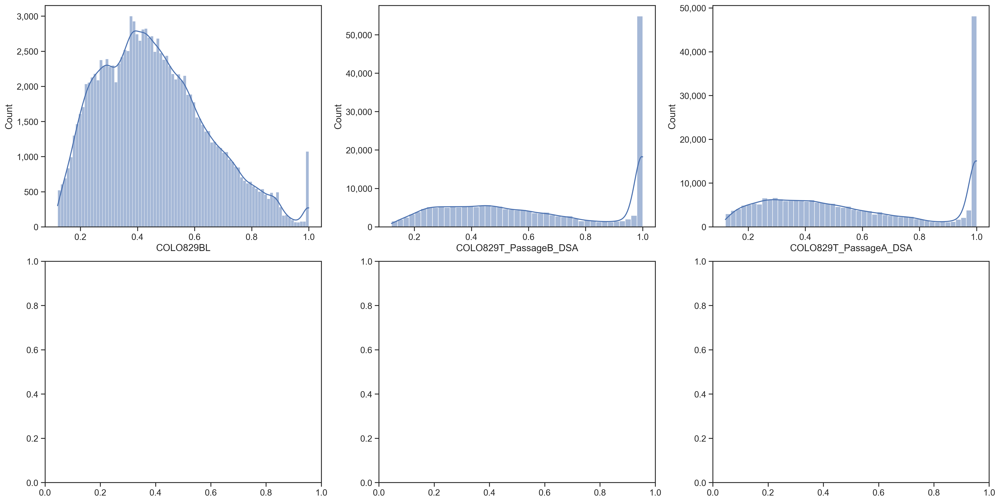

In [9]:
'''
stat
-count: show the number of observations in each bin
-frequency: show the number of observations divided by the bin width
-probability or proportion: normalize such that bar heights sum to 1
-percent: normalize such that bar heights sum to 100
-density: normalize such that the total area of the histogram equals 1
'''
fig, axes = plt.subplots(2,3, figsize=(20,10), constrained_layout=True)
sns.histplot(colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0,0])
axes[0,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0,1])
axes[0,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0,2])
axes[0,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

"""
sns.histplot(colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1,0])
axes[1,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1,1])
axes[1,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,1].set_ylim(0, 32000)
sns.histplot(colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1,2])
axes[1,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,2].set_ylim(0, 32000)

axes[0, 1].set_title('VAF for PASS SNVs', loc='center', fontsize=20)
axes[1, 1].set_title('VAF for RefCall SNVs', loc='center', fontsize=20)
"""

print(f"Minimum VAF for PASS SNVs in COLO829BL: {colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
"""
print(f"Minimum VAF for RefCall SNVs in COLO829BL: {colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
"""

'\nprint(f"Minimum DP for PASS SNVs in COLO829BL: {colobl_snvs_pass[\'COLO829BL\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\nprint(f"Minimum DP for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass[\'COLO829T_PassageB_DSA\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\nprint(f"Minimum DP for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass[\'COLO829T_PassageA_DSA\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\n\nprint(f"Minimum DP for RefCall SNVs in COLO829BL: {colobl_snvs_refcall[\'COLO829BL\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\nprint(f"Minimum DP for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall[\'COLO829T_PassageB_DSA\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\nprint(f"Minimum DP for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall[\'COLO829T_PassageA_DSA\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\n'

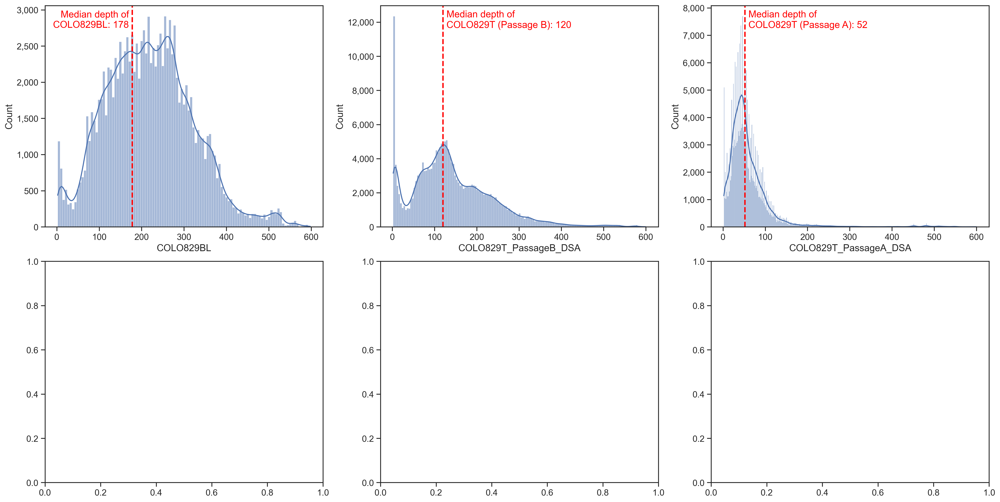

In [10]:
fig, axes = plt.subplots(2,3, figsize=(20,10), constrained_layout=True)
sns.histplot(colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[0,0])
axes[0,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,0].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
axes[0,0].text(colobl_median_dp-8, axes[0,0].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')

sns.histplot(colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[0,1])
axes[0,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,1].axvline(x=colotb_median_dp, color='red', linestyle='--', linewidth=2)
axes[0,1].text(colotb_median_dp+8, axes[0,1].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829T (Passage B): {colotb_median_dp}', color='red', ha='left')

sns.histplot(colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[0,2])
axes[0,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,2].axvline(x=colota_median_dp, color='red', linestyle='--', linewidth=2)
axes[0,2].text(colota_median_dp+8, axes[0,2].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829T (Passage A): {colota_median_dp}', color='red', ha='left')
"""
sns.histplot(colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[1,0])
axes[1,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,0].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
axes[1,0].text(colobl_median_dp-8, axes[1,0].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')

sns.histplot(colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[1,1])
axes[1,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,1].axvline(x=colotb_median_dp, color='red', linestyle='--', linewidth=2)
axes[1,1].text(colotb_median_dp+8, axes[1,1].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829T (Passage B): {colotb_median_dp}', color='red', ha='left')

sns.histplot(colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[1,2])
axes[1,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,2].axvline(x=colotb_median_dp, color='red', linestyle='--', linewidth=2)
axes[1,2].text(colotb_median_dp+8, axes[1,2].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829T (Passage B): {colotb_median_dp}', color='red', ha='left')

axes[0, 1].set_title('Read Depth for PASS SNVs', loc='center', fontsize=20)
axes[1, 1].set_title('Read Depth for RefCall SNVs', loc='center', fontsize=20)
"""

'''
print(f"Minimum DP for PASS SNVs in COLO829BL: {colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")
print(f"Minimum DP for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")
print(f"Minimum DP for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")

print(f"Minimum DP for RefCall SNVs in COLO829BL: {colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")
print(f"Minimum DP for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")
print(f"Minimum DP for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")
'''

'\nprint(f"Minimum AD for PASS SNVs in COLO829BL: {colobl_snvs_pass[\'COLO829BL\'].str.split(\':\').apply(lambda x: int(x[adindex].split(\',\')[1])).min()}")\nprint(f"Minimum AD for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass[\'COLO829T_PassageB_DSA\'].str.split(\':\').apply(lambda x: int(x[adindex].split(\',\')[1])).min()}")\nprint(f"Minimum AD for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass[\'COLO829T_PassageA_DSA\'].str.split(\':\').apply(lambda x: int(x[adindex].split(\',\')[1])).min()}")\n\nprint(f"Minimum AD for RefCall SNVs in COLO829BL: {colobl_snvs_refcall[\'COLO829BL\'].str.split(\':\').apply(lambda x: int(x[adindex].split(\',\')[1])).min()}")\nprint(f"Minimum AD for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall[\'COLO829T_PassageB_DSA\'].str.split(\':\').apply(lambda x: int(x[adindex].split(\',\')[1])).min()}")\nprint(f"Minimum AD for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall[\'COLO829T_PassageA_DSA\'].str.split(\':\').appl

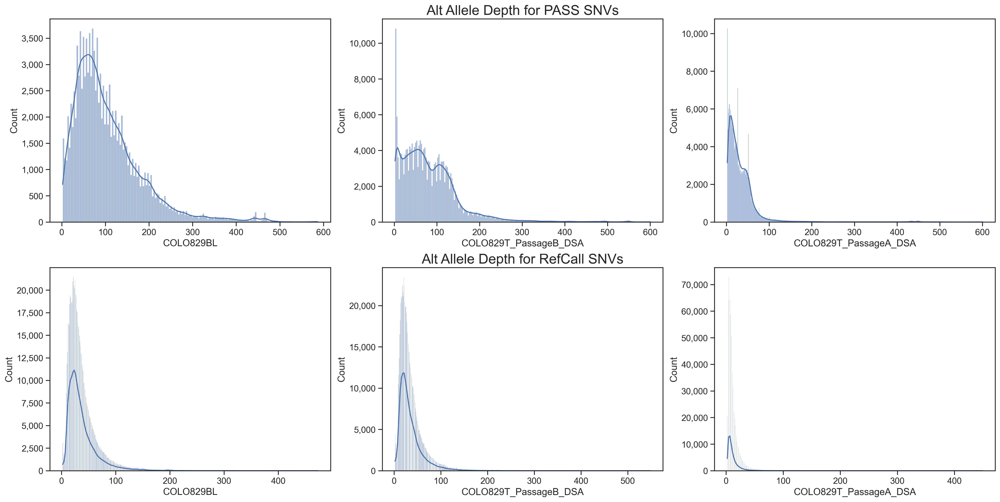

In [ ]:
"""
fig, axes = plt.subplots(2,3, figsize=(20,10), constrained_layout=True)
sns.histplot(colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), kde=True, ax=axes[0,0])
axes[0,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,0].set_rasterized(True)
sns.histplot(colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), kde=True, ax=axes[0,1])
axes[0,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,1].set_rasterized(True)
sns.histplot(colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), kde=True, ax=axes[0,2])
axes[0,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,2].set_rasterized(True)

sns.histplot(colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), lw=0.2, kde=True, ax=axes[1,0])
axes[1,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,0].set_rasterized(True)
sns.histplot(colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), kde=True, ax=axes[1,1])
axes[1,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,1].set_rasterized(True)
sns.histplot(colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), kde=True, ax=axes[1,2])
axes[1,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,2].set_rasterized(True)

axes[0, 1].set_title('Alt Allele Depth for PASS SNVs', loc='center', fontsize=20)
axes[1, 1].set_title('Alt Allele Depth for RefCall SNVs', loc='center', fontsize=20)
'''
print(f"Minimum AD for PASS SNVs in COLO829BL: {colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")
print(f"Minimum AD for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")
print(f"Minimum AD for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")

print(f"Minimum AD for RefCall SNVs in COLO829BL: {colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")
print(f"Minimum AD for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")
print(f"Minimum AD for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")
'''
"""

In [ ]:
'''
colobl_vcf[
    (colobl_vcf['FILTER'] == 'PASS') &
    (colobl_vcf['REF'].str.len() == 1) &
    (colobl_vcf['ALT'].apply(lambda x: any(len(alt) == 1 for alt in x.split(','))))
    ]

colobl_vcf[
    (colobl_vcf['FILTER'] == 'PASS') &
    (colobl_vcf['REF'].str.len() == 1) &
    (colobl_vcf['ALT'].apply(lambda x: all(len(alt) == 1 for alt in x.split(','))))
    ]

colobl_vcf[
    (colobl_vcf['FILTER'] == 'PASS') &
    (colobl_vcf['REF'].str.len() == 2) &
    (colobl_vcf['ALT'].apply(lambda x: any(len(alt) == 2 for alt in x.split(','))))
    ]
'''

"\ncolobl_vcf[\n    (colobl_vcf['FILTER'] == 'PASS') &\n    (colobl_vcf['REF'].str.len() == 1) &\n    (colobl_vcf['ALT'].apply(lambda x: any(len(alt) == 1 for alt in x.split(','))))\n    ]\n\ncolobl_vcf[\n    (colobl_vcf['FILTER'] == 'PASS') &\n    (colobl_vcf['REF'].str.len() == 1) &\n    (colobl_vcf['ALT'].apply(lambda x: all(len(alt) == 1 for alt in x.split(','))))\n    ]\n\ncolobl_vcf[\n    (colobl_vcf['FILTER'] == 'PASS') &\n    (colobl_vcf['REF'].str.len() == 2) &\n    (colobl_vcf['ALT'].apply(lambda x: any(len(alt) == 2 for alt in x.split(','))))\n    ]\n"

## Final Filtering (w/ AD)

In [ ]:
colobl_snvs_pass, colotb_snvs_pass, colota_snvs_pass

(                     CHROM      POS ID REF ALT  QUAL FILTER INFO  \
 0       haplotype1-0000001   119793  .   T   G  48.2   PASS    .   
 1       haplotype1-0000001  2005081  .   T   A   8.8   PASS    .   
 2       haplotype1-0000001  3266005  .   G   T  29.8   PASS    .   
 3       haplotype1-0000001  4855815  .   A   C  30.2   PASS    .   
 4       haplotype1-0000001  6364498  .   A   G  45.1   PASS    .   
 ...                    ...      ... ..  ..  ..   ...    ...  ...   
 124026  haplotype2-0000195    23029  .   C   T   7.4   PASS    .   
 124027  haplotype2-0000195    23040  .   C   T  11.4   PASS    .   
 124028  haplotype2-0000195    23141  .   A   G  14.8   PASS    .   
 124029  haplotype2-0000195    23237  .   A   G  11.4   PASS    .   
 124030  haplotype2-0000195    23256  .   G   A  18.1   PASS    .   
 
                     FORMAT                           COLO829BL  
 0       GT:GQ:DP:AD:VAF:PL   0/1:46:190:87,96:0.505263:48,0,51  
 1       GT:GQ:DP:AD:VAF:PL     0/1:9:

In [ ]:
"""
print('COLO829BL SNV Before AD filtering: ', f'{colobl_snvs_pass.shape[0]:,}')
print('COLO829BL SNV After  AD filtering : ', f'{colobl_snvs_pass[( colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].shape[0]:,}')
print('COLO829T Passage B SNV Before AD filtering: ', f'{colotb_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD filtering: ', f'{colotb_snvs_pass[( colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].shape[0]:,}')
print('COLO829T Passage A SNV Before AD filtering: ', f'{colota_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD filtering: ', f'{colota_snvs_pass[( colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].shape[0]:,}')

colobl_snvs_pass_ad10 = colobl_snvs_pass[( colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].reset_index(drop=True)
colotb_snvs_pass_ad10 = colotb_snvs_pass[( colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].reset_index(drop=True)
colota_snvs_pass_ad10 = colota_snvs_pass[( colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].reset_index(drop=True)

print('COLO829BL SNV Before AD≥10 filtering: ', f'{colobl_snvs_pass.shape[0]:,}')
print('COLO829BL SNV After  AD≥10 filtering : ', f'{colobl_snvs_pass_ad10.shape[0]:,}')
print('COLO829T Passage B SNV Before AD≥10 filtering: ', f'{colotb_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD≥10 filtering: ', f'{colotb_snvs_pass_ad10.shape[0]:,}')
print('COLO829T Passage A SNV Before AD≥10 filtering: ', f'{colota_snvs_pass.shape[0]:,}')
print('COLO829T Passage A SNV After  AD≥10 filtering: ', f'{colota_snvs_pass_ad10.shape[0]:,}')
"""

COLO829BL SNV Before AD≥10 filtering:  124,031
COLO829BL SNV After  AD≥10 filtering :  121,222
COLO829T Passage B SNV Before AD≥10 filtering:  205,113
COLO829T Passage B SNV After  AD≥10 filtering:  185,811
COLO829T Passage A SNV Before AD≥10 filtering:  230,756
COLO829T Passage A SNV After  AD≥10 filtering:  185,720


In [ ]:
"""
colobl_snvs_pass_ad30 = colobl_snvs_pass[( colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 30 )].reset_index(drop=True)
colotb_snvs_pass_ad30 = colotb_snvs_pass[( colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 30 )].reset_index(drop=True)
colota_snvs_pass_ad30 = colota_snvs_pass[( colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 30 )].reset_index(drop=True)

print('COLO829BL SNV Before AD≥30 filtering: ', f'{colobl_snvs_pass.shape[0]:,}')
print('COLO829BL SNV After  AD≥30 filtering : ', f'{colobl_snvs_pass_ad30.shape[0]:,}')
print('COLO829T Passage B SNV Before AD≥30 filtering: ', f'{colotb_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD≥30 filtering: ', f'{colotb_snvs_pass_ad30.shape[0]:,}')
print('COLO829T Passage A SNV Before AD≥30 filtering: ', f'{colota_snvs_pass.shape[0]:,}')
print('COLO829T Passage A SNV After  AD≥30 filtering: ', f'{colota_snvs_pass_ad30.shape[0]:,}')
"""

COLO829BL SNV Before AD≥30 filtering:  124,031
COLO829BL SNV After  AD≥30 filtering :  110,694
COLO829T Passage B SNV Before AD≥30 filtering:  205,113
COLO829T Passage B SNV After  AD≥30 filtering:  160,586
COLO829T Passage A SNV Before AD≥30 filtering:  230,756
COLO829T Passage A SNV After  AD≥30 filtering:  98,246


In [ ]:
"""
colobl_snvs_pass_ad50 = colobl_snvs_pass[( colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 50 )].reset_index(drop=True)
colotb_snvs_pass_ad50 = colotb_snvs_pass[( colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 50 )].reset_index(drop=True)
colota_snvs_pass_ad50 = colota_snvs_pass[( colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 50 )].reset_index(drop=True)

print('COLO829BL SNV Before AD≥50 filtering: ', f'{colobl_snvs_pass.shape[0]:,}')
print('COLO829BL SNV After  AD≥50 filtering : ', f'{colobl_snvs_pass_ad50.shape[0]:,}')
print('COLO829T Passage B SNV Before AD≥50 filtering: ', f'{colotb_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD≥50 filtering: ', f'{colotb_snvs_pass_ad50.shape[0]:,}')
print('COLO829T Passage A SNV Before AD≥50 filtering: ', f'{colota_snvs_pass.shape[0]:,}')
print('COLO829T Passage A SNV After  AD≥50 filtering: ', f'{colota_snvs_pass_ad50.shape[0]:,}')
"""

COLO829BL SNV Before AD≥50 filtering:  124,031
COLO829BL SNV After  AD≥50 filtering :  94,020
COLO829T Passage B SNV Before AD≥50 filtering:  205,113
COLO829T Passage B SNV After  AD≥50 filtering:  132,308
COLO829T Passage A SNV Before AD≥50 filtering:  230,756
COLO829T Passage A SNV After  AD≥50 filtering:  43,870


In [ ]:
"""
colobl_snvs_pass_ad80 = colobl_snvs_pass[( colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 80 )].reset_index(drop=True)
colotb_snvs_pass_ad80 = colotb_snvs_pass[( colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 80 )].reset_index(drop=True)
colota_snvs_pass_ad80 = colota_snvs_pass[( colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 80 )].reset_index(drop=True)

print('COLO829BL SNV Before AD≥80 filtering: ', f'{colobl_snvs_pass.shape[0]:,}')
print('COLO829BL SNV After  AD≥80 filtering : ', f'{colobl_snvs_pass_ad80.shape[0]:,}')
print('COLO829T Passage B SNV Before AD≥80 filtering: ', f'{colotb_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD≥80 filtering: ', f'{colotb_snvs_pass_ad80.shape[0]:,}')
print('COLO829T Passage A SNV Before AD≥80 filtering: ', f'{colota_snvs_pass.shape[0]:,}')
print('COLO829T Passage A SNV After  AD≥80 filtering: ', f'{colota_snvs_pass_ad80.shape[0]:,}')
"""

COLO829BL SNV Before AD≥80 filtering:  124,031
COLO829BL SNV After  AD≥80 filtering :  67,277
COLO829T Passage B SNV Before AD≥80 filtering:  205,113
COLO829T Passage B SNV After  AD≥80 filtering:  90,159
COLO829T Passage A SNV Before AD≥80 filtering:  230,756
COLO829T Passage A SNV After  AD≥80 filtering:  11,681


Minimum VAF for PASS SNVs in COLO829BL: 0.12
Minimum VAF for PASS SNVs  in COLO829T (Passage B): 0.12
Minimum VAF for PASS SNVs  in COLO829T (Passage A): 0.12


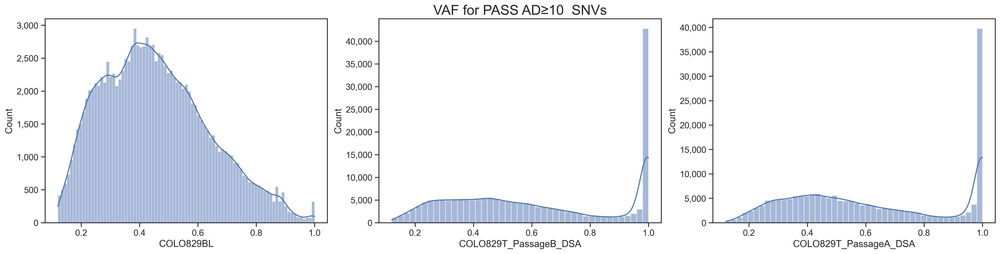

In [ ]:
"""
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad10['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_pass_ad10['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colota_snvs_pass_ad10['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

axes[1].set_title('VAF for PASS AD≥10  SNVs', loc='center', fontsize=20)

print(f"Minimum VAF for PASS SNVs in COLO829BL: {colobl_snvs_pass_ad10['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass_ad10['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass_ad10['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
"""

Minimum VAF for PASS SNVs in COLO829BL: 0.12
Minimum VAF for PASS SNVs  in COLO829T (Passage B): 0.120112
Minimum VAF for PASS SNVs  in COLO829T (Passage A): 0.120301


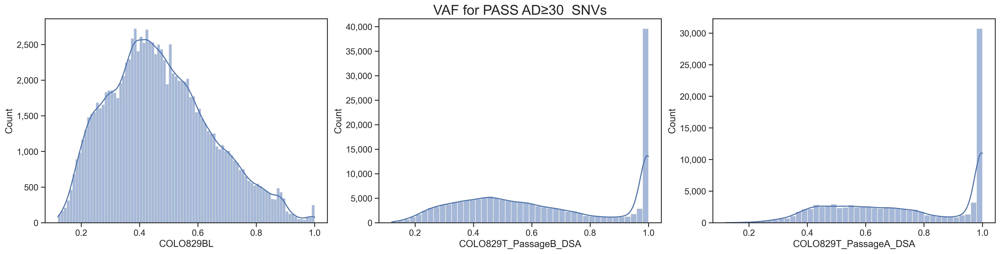

In [ ]:
"""
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad30['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_pass_ad30['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colota_snvs_pass_ad30['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

axes[1].set_title('VAF for PASS AD≥30  SNVs', loc='center', fontsize=20)

print(f"Minimum VAF for PASS SNVs in COLO829BL: {colobl_snvs_pass_ad30['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass_ad30['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass_ad30['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
"""

Minimum VAF for PASS SNVs in COLO829BL: 0.120567
Minimum VAF for PASS SNVs  in COLO829T (Passage B): 0.121655
Minimum VAF for PASS SNVs  in COLO829T (Passage A): 0.120301


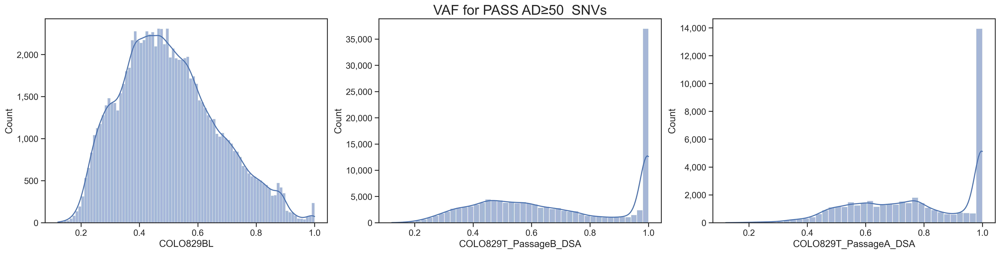

In [ ]:
"""
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad50['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_pass_ad50['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colota_snvs_pass_ad50['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

axes[1].set_title('VAF for PASS AD≥50  SNVs', loc='center', fontsize=20)

print(f"Minimum VAF for PASS SNVs in COLO829BL: {colobl_snvs_pass_ad50['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass_ad50['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass_ad50['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
"""

Minimum VAF for PASS SNVs in COLO829BL: 0.152174
Minimum VAF for PASS SNVs  in COLO829T (Passage B): 0.160396
Minimum VAF for PASS SNVs  in COLO829T (Passage A): 0.158397


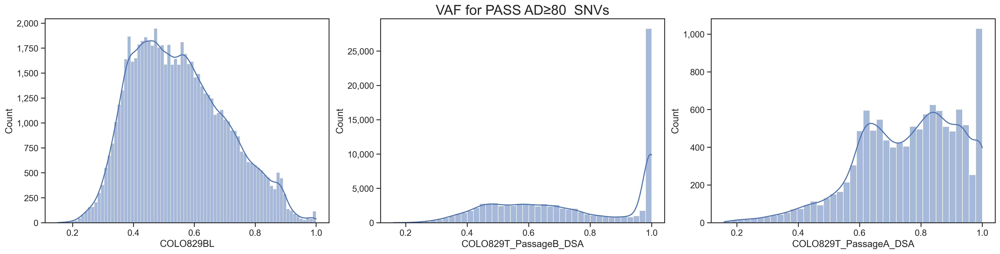

In [ ]:
"""
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad80['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_pass_ad80['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colota_snvs_pass_ad80['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

axes[1].set_title('VAF for PASS AD≥80  SNVs', loc='center', fontsize=20)

print(f"Minimum VAF for PASS SNVs in COLO829BL: {colobl_snvs_pass_ad80['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass_ad80['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass_ad80['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
"""

## Flagger/NucFreq-based Filtering

In [11]:
colobl_snvs_pass['SNVid'] = colobl_snvs_pass[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colotb_snvs_pass['SNVid'] = colotb_snvs_pass[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colota_snvs_pass['SNVid'] = colota_snvs_pass[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)

#colobl_snvs_pass_ad10['SNVid'] = colobl_snvs_pass_ad10[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
#colobl_snvs_pass_ad30['SNVid'] = colobl_snvs_pass_ad30[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
#colobl_snvs_pass_ad50['SNVid'] = colobl_snvs_pass_ad50[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
#colobl_snvs_pass_ad80['SNVid'] = colobl_snvs_pass_ad50[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
#colotb_snvs_pass_ad10['SNVid'] = colotb_snvs_pass_ad10[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
#colota_snvs_pass_ad10['SNVid'] = colota_snvs_pass_ad10[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)

In [12]:
colobl_snvs_pass

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829BL,SNVid
0,haplotype1-0000001,119793,.,T,G,48.2,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:46:190:87,96:0.505263:48,0,51",haplotype1-0000001_119793_T_G
1,haplotype1-0000001,2005081,.,T,A,8.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:9:123:68,55:0.447154:8,0,27",haplotype1-0000001_2005081_T_A
2,haplotype1-0000001,3266005,.,G,T,29.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:30:175:107,68:0.388571:29,0,52",haplotype1-0000001_3266005_G_T
3,haplotype1-0000001,4855815,.,A,C,30.2,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:2:142:49,72:0.507042:26,13,1",haplotype1-0000001_4855815_A_C
4,haplotype1-0000001,6364498,.,A,G,45.1,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:45:200:105,94:0.47:45,0,57",haplotype1-0000001_6364498_A_G
...,...,...,...,...,...,...,...,...,...,...,...
124026,haplotype2-0000195,23029,.,C,T,7.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:7:56:48,8:0.142857:6,0,42",haplotype2-0000195_23029_C_T
124027,haplotype2-0000195,23040,.,C,T,11.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:11:56:48,8:0.142857:11,0,44",haplotype2-0000195_23040_C_T
124028,haplotype2-0000195,23141,.,A,G,14.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:15:55:47,8:0.145455:14,0,44",haplotype2-0000195_23141_A_G
124029,haplotype2-0000195,23237,.,A,G,11.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:11:55:47,8:0.145455:11,0,42",haplotype2-0000195_23237_A_G


### Mark Flagger, NucFreq annotation to vcf

In [13]:
temp_annotated_colobl_snvs_pass = pd.merge(colobl_snvs_pass, colobl_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colobl_snvs_pass_annot = pd.merge(temp_annotated_colobl_snvs_pass, colobl_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

temp_annotated_colotb_snvs_pass = pd.merge(colotb_snvs_pass, colotb_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colotb_snvs_pass_annot = pd.merge(temp_annotated_colotb_snvs_pass, colotb_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

temp_annotated_colota_snvs_pass = pd.merge(colota_snvs_pass, colota_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colota_snvs_pass_annot = pd.merge(temp_annotated_colota_snvs_pass, colota_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

del temp_annotated_colobl_snvs_pass, temp_annotated_colotb_snvs_pass, temp_annotated_colota_snvs_pass

"""
temp_annotated_colobl_snvs_pass_ad10 = pd.merge(colobl_snvs_pass_ad10, colobl_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colobl_snvs_pass_ad10_annot = pd.merge(temp_annotated_colobl_snvs_pass_ad10, colobl_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

temp_annotated_colotb_snvs_pass_ad10 = pd.merge(colotb_snvs_pass_ad10, colotb_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colotb_snvs_pass_ad10_annot = pd.merge(temp_annotated_colotb_snvs_pass_ad10, colotb_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

temp_annotated_colota_snvs_pass_ad10 = pd.merge(colota_snvs_pass_ad10, colota_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colota_snvs_pass_ad10_annot = pd.merge(temp_annotated_colota_snvs_pass_ad10, colota_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

del temp_annotated_colobl_snvs_pass, temp_annotated_colobl_snvs_pass_ad10, temp_annotated_colotb_snvs_pass, temp_annotated_colotb_snvs_pass_ad10, temp_annotated_colota_snvs_pass, temp_annotated_colota_snvs_pass_ad10
"""

"\ntemp_annotated_colobl_snvs_pass_ad10 = pd.merge(colobl_snvs_pass_ad10, colobl_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')\ncolobl_snvs_pass_ad10_annot = pd.merge(temp_annotated_colobl_snvs_pass_ad10, colobl_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')\n\ntemp_annotated_colotb_snvs_pass_ad10 = pd.merge(colotb_snvs_pass_ad10, colotb_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')\ncolotb_snvs_pass_ad10_annot = pd.merge(temp_annotated_colotb_snvs_pass_ad10, colotb_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')\n\ntemp_annotated_colota_snvs_pass_ad10 = pd.merge(colota_snvs_pass_ad10, colota_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')\ncolota_snvs_pass_ad10_annot = pd.merge(temp_annotated_colota_snvs_pass_ad10, colota_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')\n\ndel temp_annotated_colobl_snvs_pass, temp_annotated_colobl_snvs_pass_ad10, temp_annotated_colotb_snvs_pass, temp_annotated_colotb_snvs_pass_ad10, temp_annotated_colota_s

In [14]:
print(colobl_snvs_pass_annot['Flagger'].value_counts())
print(colotb_snvs_pass_annot['Flagger'].value_counts())
print(colota_snvs_pass_annot['Flagger'].value_counts())

Flagger
Hap    103001
Err      9776
Dup      8650
Col      2441
Unk       163
Name: count, dtype: int64
Flagger
Hap    182127
Dup     10259
Err     10189
Col      2383
Unk       155
Name: count, dtype: int64
Flagger
Hap    205329
Dup     12129
Err     10474
Col      2637
Unk       187
Name: count, dtype: int64


## COLO829BL wo/ AD filtering (PASS)

### VAF histogram according to Flagger annotation

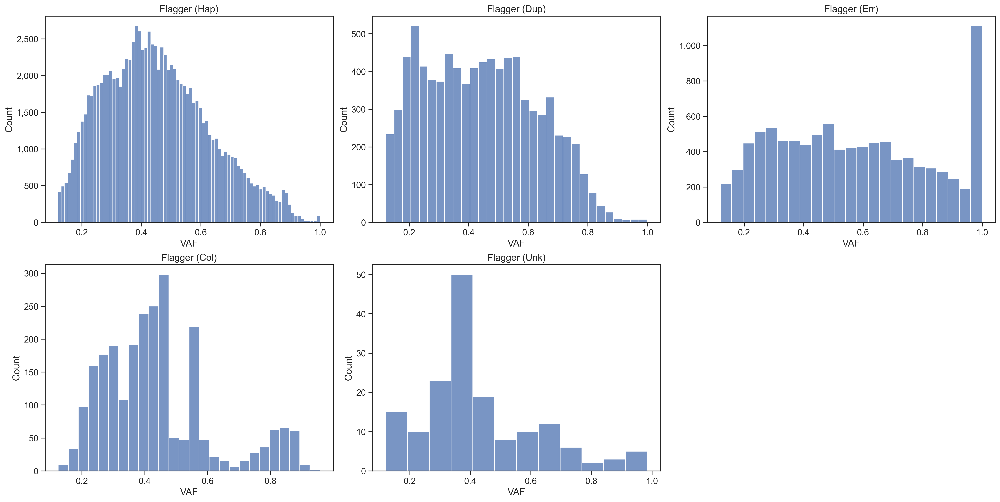

In [15]:
categories = ['Hap', 'Dup', 'Err', 'Col', 'Unk']
titles = ['Flagger (Hap)', 'Flagger (Dup)', 'Flagger (Err)', 'Flagger (Col)', 'Flagger (Unk)']

# Create the subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)

# Loop through the categories and create the histograms
for i, (category, title) in enumerate(zip(categories, titles)):
    row, col = divmod(i, 3)
    sns.histplot(colobl_snvs_pass_annot[colobl_snvs_pass_annot['Flagger'] == category]['COLO829BL']
                 .str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[row, col])
    axes[row, col].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[row, col].set_title(title)
    axes[row, col].set_xlabel('VAF')

# Remove the last subplot (axes[1,2])
fig.delaxes(axes[1, 2])

### DP histogram according to NucFreq annotation

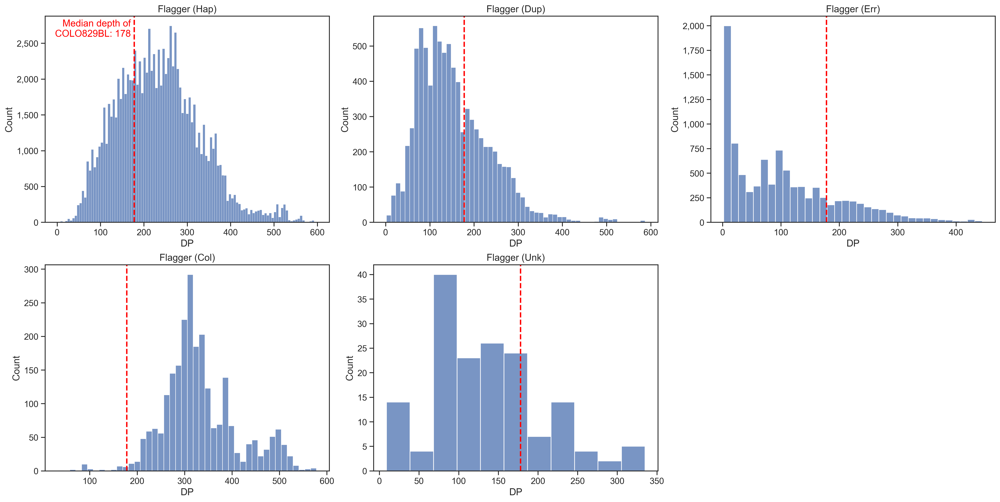

In [16]:
categories = ['Hap', 'Dup', 'Err', 'Col', 'Unk']
titles = ['Flagger (Hap)', 'Flagger (Dup)', 'Flagger (Err)', 'Flagger (Col)', 'Flagger (Unk)']

fig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)

for i, (category, title) in enumerate(zip(categories, titles)):
    row, col = divmod(i, 3)
    sns.histplot(colobl_snvs_pass_annot[colobl_snvs_pass_annot['Flagger'] == category]['COLO829BL']
                 .str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[row, col])
    axes[row, col].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[row, col].set_title(title)
    axes[row, col].set_xlabel('DP')
    axes[row, col].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
    if category == 'Hap':
        axes[row, col].text(170, axes[row, col].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')

fig.delaxes(axes[1, 2])

### VAF histogram according to NucFreq annotation

In [17]:
"""
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'].isna()]['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0].set_title('NucFreq (Neither)')
axes[0].set_xlabel('VAF')
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'] == 'misassembly']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1].set_title('NucFreq (misassembly)')
axes[1].set_xlabel('VAF')
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'] == 'collapse']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[2].set_title('Flagger (collapse)')
axes[2].set_xlabel('VAF')
"""

"\nfig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)\nsns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'].isna()]['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])\naxes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\naxes[0].set_title('NucFreq (Neither)')\naxes[0].set_xlabel('VAF')\nsns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'] == 'misassembly']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])\naxes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\naxes[1].set_title('NucFreq (misassembly)')\naxes[1].set_xlabel('VAF')\nsns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'] == 'collapse']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[2])\naxes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter

### DP histogram according to NucFreq annotation

In [18]:
"""
categories = [None, 'misassembly', 'collapse']
titles = ['NucFreq (Neither)', 'NucFreq (misassembly)', 'Flagger (collapse)']

fig, axes = plt.subplots(1, 3, figsize=(20, 5), constrained_layout=True)

for i, (category, title) in enumerate(zip(categories, titles)):
    if category is None:
        data = colobl_snvs_pass_annot[colobl_snvs_pass_annot['NucFreq'].isna()]['COLO829BL']
    else:
        data = colobl_snvs_pass_annot[colobl_snvs_pass_annot['NucFreq'] == category]['COLO829BL']
    
    sns.histplot(data.str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[i])
    axes[i].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[i].set_title(title)
    axes[i].set_xlabel('DP')
    axes[i].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
    
    if category is None:
        axes[i].text(170, axes[i].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')
"""

"\ncategories = [None, 'misassembly', 'collapse']\ntitles = ['NucFreq (Neither)', 'NucFreq (misassembly)', 'Flagger (collapse)']\n\nfig, axes = plt.subplots(1, 3, figsize=(20, 5), constrained_layout=True)\n\nfor i, (category, title) in enumerate(zip(categories, titles)):\n    if category is None:\n        data = colobl_snvs_pass_annot[colobl_snvs_pass_annot['NucFreq'].isna()]['COLO829BL']\n    else:\n        data = colobl_snvs_pass_annot[colobl_snvs_pass_annot['NucFreq'] == category]['COLO829BL']\n    \n    sns.histplot(data.str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[i])\n    axes[i].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\n    axes[i].set_title(title)\n    axes[i].set_xlabel('DP')\n    axes[i].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)\n    \n    if category is None:\n        axes[i].text(170, axes[i].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', h

In [19]:
"""
categories = ['Hap', 'Dup', 'Err', 'Col', 'Unk']
titles = ['Flagger (Hap)', 'Flagger (Dup)', 'Flagger (Err)', 'Flagger (Col)', 'Flagger (Unk)']

# Create the subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)

# Loop through the categories and create the histograms
for i, (category, title) in enumerate(zip(categories, titles)):
    row, col = divmod(i, 3)
    sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['Flagger'] == category]['COLO829BL']
                 .str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[row, col])
    axes[row, col].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[row, col].set_title(title)
    axes[row, col].set_xlabel('VAF')

# Remove the last subplot (axes[1,2])
fig.delaxes(axes[1, 2])
"""

"\ncategories = ['Hap', 'Dup', 'Err', 'Col', 'Unk']\ntitles = ['Flagger (Hap)', 'Flagger (Dup)', 'Flagger (Err)', 'Flagger (Col)', 'Flagger (Unk)']\n\n# Create the subplots\nfig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)\n\n# Loop through the categories and create the histograms\nfor i, (category, title) in enumerate(zip(categories, titles)):\n    row, col = divmod(i, 3)\n    sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['Flagger'] == category]['COLO829BL']\n                 .str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[row, col])\n    axes[row, col].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\n    axes[row, col].set_title(title)\n    axes[row, col].set_xlabel('VAF')\n\n# Remove the last subplot (axes[1,2])\nfig.delaxes(axes[1, 2])\n"

In [20]:
"""
categories = ['Hap', 'Dup', 'Err', 'Col', 'Unk']
titles = ['Flagger (Hap)', 'Flagger (Dup)', 'Flagger (Err)', 'Flagger (Col)', 'Flagger (Unk)']

fig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)

for i, (category, title) in enumerate(zip(categories, titles)):
    row, col = divmod(i, 3)
    sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['Flagger'] == category]['COLO829BL']
                 .str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[row, col])
    axes[row, col].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[row, col].set_title(title)
    axes[row, col].set_xlabel('DP')
    axes[row, col].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
    if category == 'Hap':
        axes[row, col].text(170, axes[row, col].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')

fig.delaxes(axes[1, 2])
"""

"\ncategories = ['Hap', 'Dup', 'Err', 'Col', 'Unk']\ntitles = ['Flagger (Hap)', 'Flagger (Dup)', 'Flagger (Err)', 'Flagger (Col)', 'Flagger (Unk)']\n\nfig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)\n\nfor i, (category, title) in enumerate(zip(categories, titles)):\n    row, col = divmod(i, 3)\n    sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['Flagger'] == category]['COLO829BL']\n                 .str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[row, col])\n    axes[row, col].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\n    axes[row, col].set_title(title)\n    axes[row, col].set_xlabel('DP')\n    axes[row, col].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)\n    if category == 'Hap':\n        axes[row, col].text(170, axes[row, col].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')\n\nfig.delaxes(axes[1, 2]

In [21]:
"""
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'].isna()]['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0].set_title('NucFreq (Neither)')
axes[0].set_xlabel('VAF')
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'] == 'misassembly']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1].set_title('NucFreq (misassembly)')
axes[1].set_xlabel('VAF')
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'] == 'collapse']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[2].set_title('Flagger (collapse)')
axes[2].set_xlabel('VAF')
"""

"\nfig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)\nsns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'].isna()]['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])\naxes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\naxes[0].set_title('NucFreq (Neither)')\naxes[0].set_xlabel('VAF')\nsns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'] == 'misassembly']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])\naxes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\naxes[1].set_title('NucFreq (misassembly)')\naxes[1].set_xlabel('VAF')\nsns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'] == 'collapse']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[2])\naxes[2].get_yaxis().set_major_formatter(matplotlib.ticke

In [22]:
"""
categories = [None, 'misassembly', 'collapse']
titles = ['NucFreq (Neither)', 'NucFreq (misassembly)', 'Flagger (collapse)']

fig, axes = plt.subplots(1, 3, figsize=(20, 5), constrained_layout=True)

for i, (category, title) in enumerate(zip(categories, titles)):
    if category is None:
        data = colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'].isna()]['COLO829BL']
    else:
        data = colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'] == category]['COLO829BL']
    
    sns.histplot(data.str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[i])
    axes[i].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[i].set_title(title)
    axes[i].set_xlabel('DP')
    axes[i].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
    
    if category is None:
        axes[i].text(170, axes[i].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')
"""

"\ncategories = [None, 'misassembly', 'collapse']\ntitles = ['NucFreq (Neither)', 'NucFreq (misassembly)', 'Flagger (collapse)']\n\nfig, axes = plt.subplots(1, 3, figsize=(20, 5), constrained_layout=True)\n\nfor i, (category, title) in enumerate(zip(categories, titles)):\n    if category is None:\n        data = colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'].isna()]['COLO829BL']\n    else:\n        data = colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'] == category]['COLO829BL']\n    \n    sns.histplot(data.str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[i])\n    axes[i].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\n    axes[i].set_title(title)\n    axes[i].set_xlabel('DP')\n    axes[i].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)\n    \n    if category is None:\n        axes[i].text(170, axes[i].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_

## Comparison btw Passage B and Passage A

In [23]:
colobl_snvs_pass_set = set(colobl_snvs_pass['SNVid'].values)


colotb_snvs_pass_set = set(colotb_snvs_pass['SNVid'].values)

colota_snvs_pass_set = set(colota_snvs_pass['SNVid'].values)

"""
colobl_snvs_pass_ad10_set = set(colobl_snvs_pass_ad10['SNVid'].values)
colobl_snvs_pass_ad30_set = set(colobl_snvs_pass_ad30['SNVid'].values)
colobl_snvs_pass_ad50_set = set(colobl_snvs_pass_ad50['SNVid'].values)
colobl_snvs_pass_ad80_set = set(colobl_snvs_pass_ad80['SNVid'].values)

colotb_snvs_pass_ad10_set = set(colotb_snvs_pass_ad10['SNVid'].values)
colota_snvs_pass_ad10_set = set(colota_snvs_pass_ad10['SNVid'].values)
"""

"\ncolobl_snvs_pass_ad10_set = set(colobl_snvs_pass_ad10['SNVid'].values)\ncolobl_snvs_pass_ad30_set = set(colobl_snvs_pass_ad30['SNVid'].values)\ncolobl_snvs_pass_ad50_set = set(colobl_snvs_pass_ad50['SNVid'].values)\ncolobl_snvs_pass_ad80_set = set(colobl_snvs_pass_ad80['SNVid'].values)\n\ncolotb_snvs_pass_ad10_set = set(colotb_snvs_pass_ad10['SNVid'].values)\ncolota_snvs_pass_ad10_set = set(colota_snvs_pass_ad10['SNVid'].values)\n"

In [24]:
"""
total = len(colotb_snvs_pass_set.union(colobl_snvs_pass_set))
venn = venn2([colotb_snvs_pass_set, colobl_snvs_pass_set], 
             ('Passage B', 'COLO829BL'),
             subset_label_formatter=lambda x: f"{x:,}\n({(x/total):.2%})")
"""

'\ntotal = len(colotb_snvs_pass_set.union(colobl_snvs_pass_set))\nvenn = venn2([colotb_snvs_pass_set, colobl_snvs_pass_set], \n             (\'Passage B\', \'COLO829BL\'),\n             subset_label_formatter=lambda x: f"{x:,}\n({(x/total):.2%})")\n'

In [25]:
sns.set_theme(font="Arial", font_scale=1.00, style='ticks')
matplotlib.rcParams['figure.dpi'] = 300
plt.rc("axes.spines", top=False, right=False)

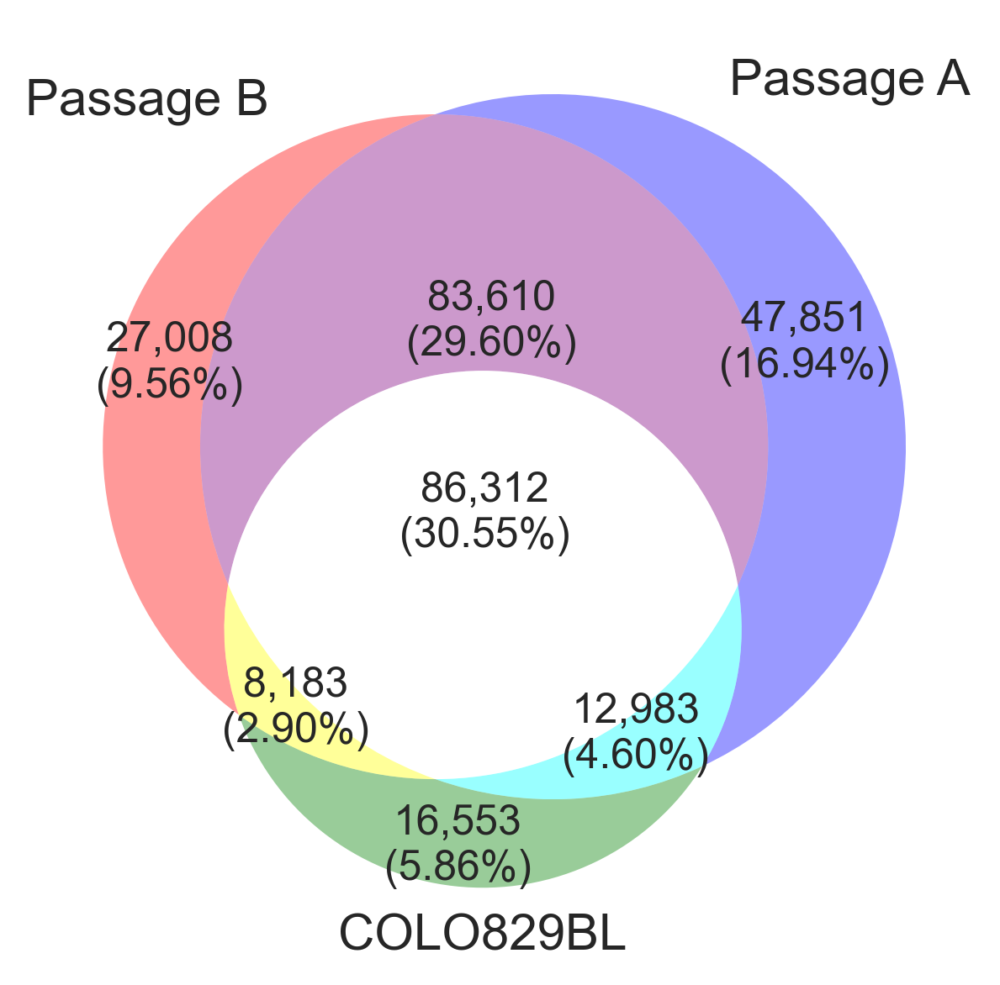

In [26]:
total = len((colotb_snvs_pass_set.union(colota_snvs_pass_set)).union(colobl_snvs_pass_set))
venn = venn3([colotb_snvs_pass_set, colota_snvs_pass_set, colobl_snvs_pass_set], 
             ('Passage B', 'Passage A', 'COLO829BL'),
             subset_label_formatter=lambda x: f"{x:,}\n({(x/total):.2%})")
venn.get_patch_by_id('100').set_color('red')
venn.get_patch_by_id('010').set_color('blue')
venn.get_patch_by_id('001').set_color('green')
venn.get_patch_by_id('110').set_color('purple')
venn.get_patch_by_id('101').set_color('yellow')
venn.get_patch_by_id('011').set_color('cyan')
venn.get_patch_by_id('111').set_color('white')


for i in ['100', '010', '001', '110', '101', '011', '111']:
    venn.get_patch_by_id(i).set_edgecolor('none')
    venn.get_patch_by_id(i).set_alpha(0.4)

In [27]:
tb_glfilt_onlytb_set = colotb_snvs_pass_set.difference(colota_snvs_pass_set).difference(colobl_snvs_pass_set)
ta_glfilt_onlyta_set = colota_snvs_pass_set.difference(colotb_snvs_pass_set).difference(colobl_snvs_pass_set)
tba_glfilt_tba_set = colotb_snvs_pass_set.difference(colobl_snvs_pass_set).intersection(colota_snvs_pass_set.difference(colobl_snvs_pass_set))

colot_glfilt_set = tb_glfilt_onlytb_set.union(ta_glfilt_onlyta_set).union(tba_glfilt_tba_set)
print(f'{len(tb_glfilt_onlytb_set):,}')
print(f'{len(ta_glfilt_onlyta_set):,}')
print(f'{len(tba_glfilt_tba_set):,}')
print(f'{len(colot_glfilt_set):,}')

27,008
47,851
83,610
158,469


In [28]:
colotb_snvs_pass_annot[colotb_snvs_pass_annot['SNVid'].isin(tb_glfilt_onlytb_set)]['Flagger'].value_counts()

Flagger
Hap    23521
Err     1857
Dup     1549
Col       69
Unk       12
Name: count, dtype: int64

In [29]:
colota_snvs_pass_annot[colota_snvs_pass_annot['SNVid'].isin(ta_glfilt_onlyta_set)]['Flagger'].value_counts()

Flagger
Hap    41964
Dup     3122
Err     2500
Col      204
Unk       61
Name: count, dtype: int64

In [30]:
print("These two should be the same")
print(colotb_snvs_pass_annot[colotb_snvs_pass_annot['SNVid'].isin(tba_glfilt_tba_set)]['Flagger'].value_counts())
print(colota_snvs_pass_annot[colota_snvs_pass_annot['SNVid'].isin(tba_glfilt_tba_set)]['Flagger'].value_counts())

These two should be the same
Flagger
Hap    79470
Dup     2453
Err     1523
Col      142
Unk       22
Name: count, dtype: int64
Flagger
Hap    79470
Dup     2453
Err     1523
Col      142
Unk       22
Name: count, dtype: int64


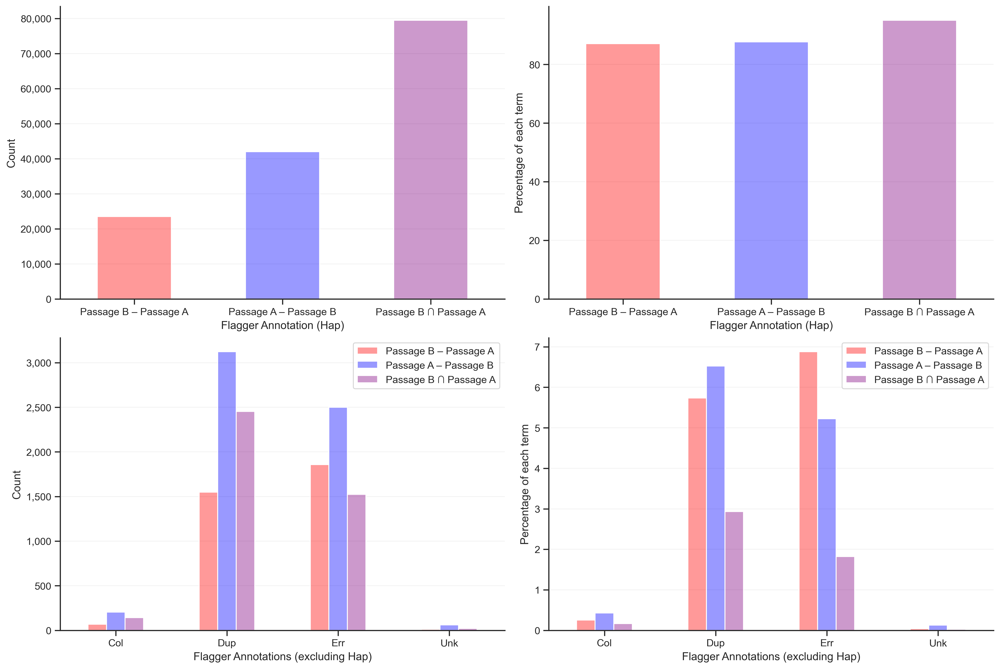

In [31]:
df_counts = pd.DataFrame({'Passage B – Passage A': colotb_snvs_pass_annot[colotb_snvs_pass_annot['SNVid'].isin(tb_glfilt_onlytb_set)]['Flagger'].value_counts(), 
                          'Passage A – Passage B': colota_snvs_pass_annot[colota_snvs_pass_annot['SNVid'].isin(ta_glfilt_onlyta_set)]['Flagger'].value_counts(), 
                          'Passage B ∩ Passage A': colotb_snvs_pass_annot[colotb_snvs_pass_annot['SNVid'].isin(tba_glfilt_tba_set)]['Flagger'].value_counts()})
df_proportions = df_counts.div(df_counts.sum(axis=0), axis=1)*100

colors = {
    'Passage B – Passage A': (1, 0, 0, 0.4),
    'Passage A – Passage B': (0, 0, 1, 0.4),
    'Passage B ∩ Passage A': (0.5, 0, 0.5, 0.4)
}

fig, axes = plt.subplots(2, 2, figsize=(15, 10), constrained_layout=True)

df_counts.loc['Hap'].plot(kind='bar', width=0.5, color=[colors[col] for col in df_counts.columns], ax=axes[0,0]).grid(axis='y', zorder=0, alpha=0.2)
axes[0,0].set_xlabel('Flagger Annotation (Hap)')
axes[0,0].set_ylabel('Count')
axes[0,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,0].tick_params(axis='x', rotation=0)
df_proportions.loc['Hap'].plot(kind='bar', width=0.5, color=[colors[col] for col in df_counts.columns], ax=axes[0,1]).grid(axis='y', zorder=0, alpha=0.2)
axes[0,1].set_xlabel('Flagger Annotation (Hap)')
axes[0,1].set_ylabel('Percentage of each term')
axes[0,1].tick_params(axis='x', rotation=0)

df_counts.drop('Hap').plot(kind='bar', width=0.5, color=[colors[col] for col in df_counts.columns], ax=axes[1,0]).grid(axis='y', zorder=0, alpha=0.2)
axes[1,0].set_xlabel('Flagger Annotations (excluding Hap)')
axes[1,0].set_ylabel('Count')
axes[1,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,0].tick_params(axis='x', rotation=0)
df_proportions.drop('Hap').plot(kind='bar', width=0.5, color=[colors[col] for col in df_counts.columns], ax=axes[1,1]).grid(axis='y', zorder=0, alpha=0.2)
axes[1,1].set_xlabel('Flagger Annotations (excluding Hap)')
axes[1,1].set_ylabel('Percentage of each term')
axes[1,1].tick_params(axis='x', rotation=0)

In [32]:
"""
fig, axes = plt.subplots(1,2, figsize=(15,5), constrained_layout=True)
sns.histplot(colotb_snvs_pass_ad10_BiAcomp['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0].set_ylim(0, 3000)
sns.histplot(colota_snvs_pass_ad10_BiAcomp['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1].set_ylim(0, 3000)
"""

"\nfig, axes = plt.subplots(1,2, figsize=(15,5), constrained_layout=True)\nsns.histplot(colotb_snvs_pass_ad10_BiAcomp['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])\naxes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\naxes[0].set_ylim(0, 3000)\nsns.histplot(colota_snvs_pass_ad10_BiAcomp['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])\naxes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\naxes[1].set_ylim(0, 3000)\n"

# Test

In [33]:
colotb_snvs_pass['SNVid'] = colotb_snvs_pass[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
temp_annotated_colotb_snvs_pass = pd.merge(colotb_snvs_pass, colotb_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')

colotb_snvs_pass_annot = pd.merge(temp_annotated_colotb_snvs_pass, colotb_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')



colotb_snvs_pass_annot

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829T_PassageB_DSA,SNVid,Flagger,NucFreq
0,haplotype1-0000001,345669,.,C,T,65,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:59:133:2,131:0.984962:65,60,0",haplotype1-0000001_345669_C_T,Hap,NaN
1,haplotype1-0000001,381602,.,G,T,70.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:65:131:0,131:1:70,66,0",haplotype1-0000001_381602_G_T,Hap,NaN
2,haplotype1-0000001,436345,.,G,A,58.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:53:49:0,49:1:58,54,0",haplotype1-0000001_436345_G_A,Hap,NaN
3,haplotype1-0000001,493800,.,G,A,68.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:63:83:0,83:1:68,63,0",haplotype1-0000001_493800_G_A,Hap,NaN
4,haplotype1-0000001,547974,.,A,G,71.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:65:123:0,123:1:71,66,0",haplotype1-0000001_547974_A_G,Hap,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
205108,haplotype2-0000194,48714,.,T,C,46.5,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:21:20:0,20:1:46,21,0",haplotype2-0000194_48714_T_C,Dup,NaN
205109,haplotype2-0000194,49083,.,G,C,48,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:20:19:0,19:1:47,20,0",haplotype2-0000194_49083_G_C,Dup,NaN
205110,haplotype2-0000194,52592,.,A,G,53,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:31:10:0,10:1:52,30,0",haplotype2-0000194_52592_A_G,Dup,NaN
205111,haplotype2-0000194,52823,.,C,G,51.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:29:10:0,10:1:51,29,0",haplotype2-0000194_52823_C_G,Dup,NaN


In [35]:
"""colotb_snvs_pass_annot['SNVid'].isin(colobl_snvs_pass_ad10['SNVid']).value_counts()"""

"colotb_snvs_pass_annot['SNVid'].isin(colobl_snvs_pass_ad10['SNVid']).value_counts()"

In [36]:
"""colotb_snvs_pass_annot['COLO829BL_Germline_ad10'] = colotb_snvs_pass_annot['SNVid'].isin(colobl_snvs_pass_ad10['SNVid']).map({True: 'Yes', False: 'No'})"""

"colotb_snvs_pass_annot['COLO829BL_Germline_ad10'] = colotb_snvs_pass_annot['SNVid'].isin(colobl_snvs_pass_ad10['SNVid']).map({True: 'Yes', False: 'No'})"

In [37]:
test1 = pd.concat([colotb_snvs_pass_annot['SNVid'], colotb_snvs_pass_annot['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), colotb_snvs_pass_annot['Flagger']], axis=1)

In [38]:
bins = list(range(0, 302, 10)) + [test1['COLO829T_PassageB_DSA'].max() + 1]
test1['Range'] = pd.cut(test1['COLO829T_PassageB_DSA'], bins=bins)
test1

,SNVid,COLO829T_PassageB_DSA,Flagger,Range
0,haplotype1-0000001_345669_C_T,131,Hap,"(130, 140]"
1,haplotype1-0000001_381602_G_T,131,Hap,"(130, 140]"
2,haplotype1-0000001_436345_G_A,49,Hap,"(40, 50]"
3,haplotype1-0000001_493800_G_A,83,Hap,"(80, 90]"
4,haplotype1-0000001_547974_A_G,123,Hap,"(120, 130]"
...,...,...,...,...
205108,haplotype2-0000194_48714_T_C,20,Dup,"(10, 20]"
205109,haplotype2-0000194_49083_G_C,19,Dup,"(10, 20]"
205110,haplotype2-0000194_52592_A_G,10,Dup,"(0, 10]"
205111,haplotype2-0000194_52823_C_G,10,Dup,"(0, 10]"


/tmp/ipykernel_1311173/2574825411.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  proportion_df = test1.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)


Text(0, 0.5, 'Proportion of Flagger')

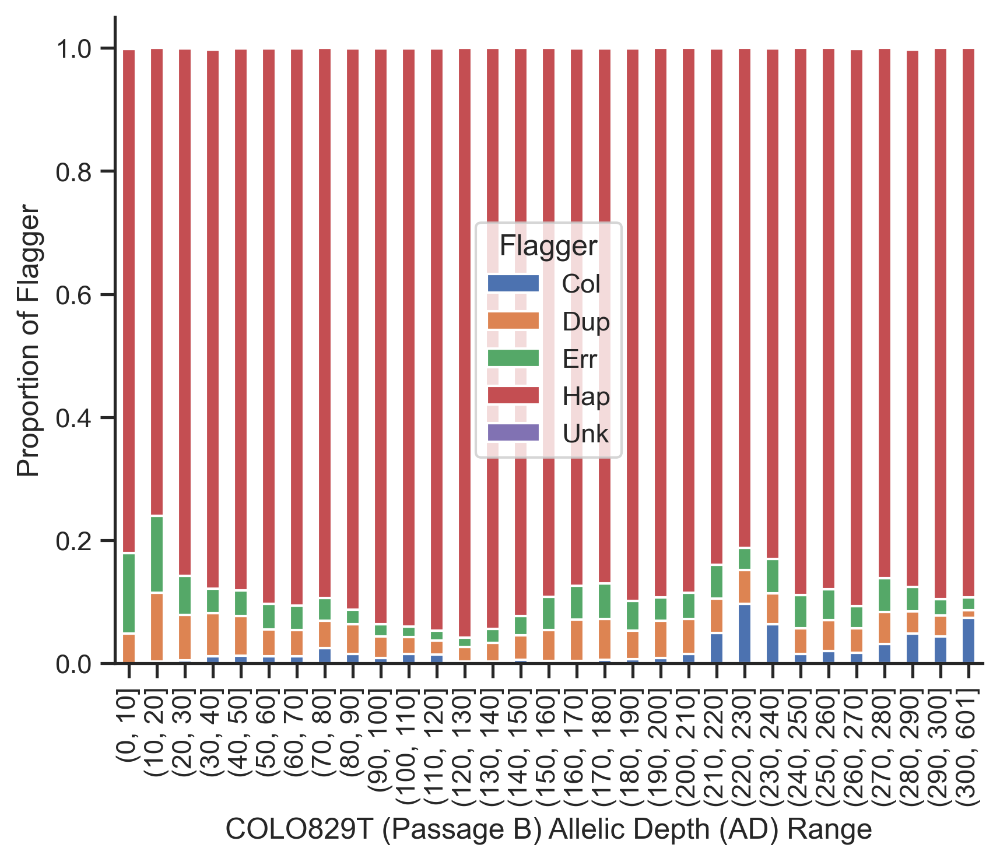

In [39]:
proportion_df = test1.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)
proportion_df = proportion_df.div(proportion_df.sum(axis=1), axis=0)
proportion_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Allelic Depth (AD) Range')
plt.ylabel('Proportion of Flagger')

/tmp/ipykernel_1311173/1155899289.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = test1.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)


Text(0, 0.5, 'Count of Flagger')

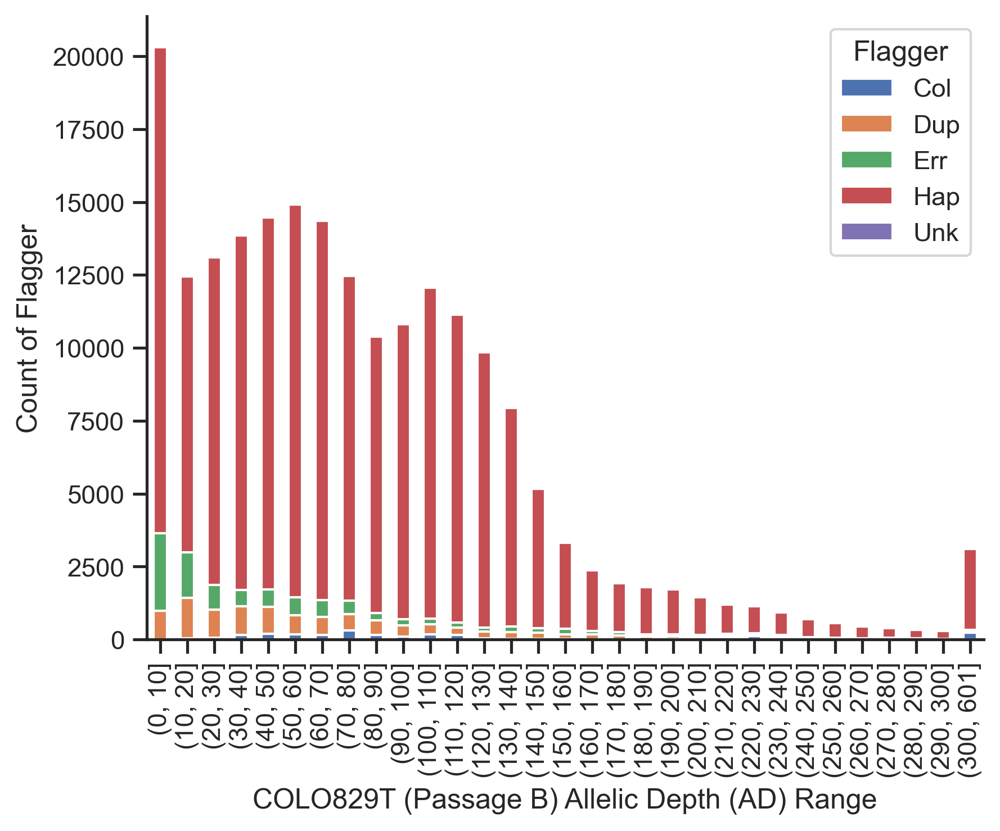

In [40]:
count_df = test1.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)
count_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Allelic Depth (AD) Range')
plt.ylabel('Count of Flagger')

In [41]:
test2 = pd.concat([colotb_snvs_pass_annot['SNVid'], colotb_snvs_pass_annot['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), colotb_snvs_pass_annot['Flagger']], axis=1)

bins = list(range(0, 302, 10)) + [test2['COLO829T_PassageB_DSA'].max() + 1]
test2['Range'] = pd.cut(test2['COLO829T_PassageB_DSA'], bins=bins)
test2

,SNVid,COLO829T_PassageB_DSA,Flagger,Range
0,haplotype1-0000001_345669_C_T,133,Hap,"(130, 140]"
1,haplotype1-0000001_381602_G_T,131,Hap,"(130, 140]"
2,haplotype1-0000001_436345_G_A,49,Hap,"(40, 50]"
3,haplotype1-0000001_493800_G_A,83,Hap,"(80, 90]"
4,haplotype1-0000001_547974_A_G,123,Hap,"(120, 130]"
...,...,...,...,...
205108,haplotype2-0000194_48714_T_C,20,Dup,"(10, 20]"
205109,haplotype2-0000194_49083_G_C,19,Dup,"(10, 20]"
205110,haplotype2-0000194_52592_A_G,10,Dup,"(0, 10]"
205111,haplotype2-0000194_52823_C_G,10,Dup,"(0, 10]"


/tmp/ipykernel_1311173/1099746627.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  proportion_df = test2.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)


Text(0, 0.5, 'Proportion of Flagger')

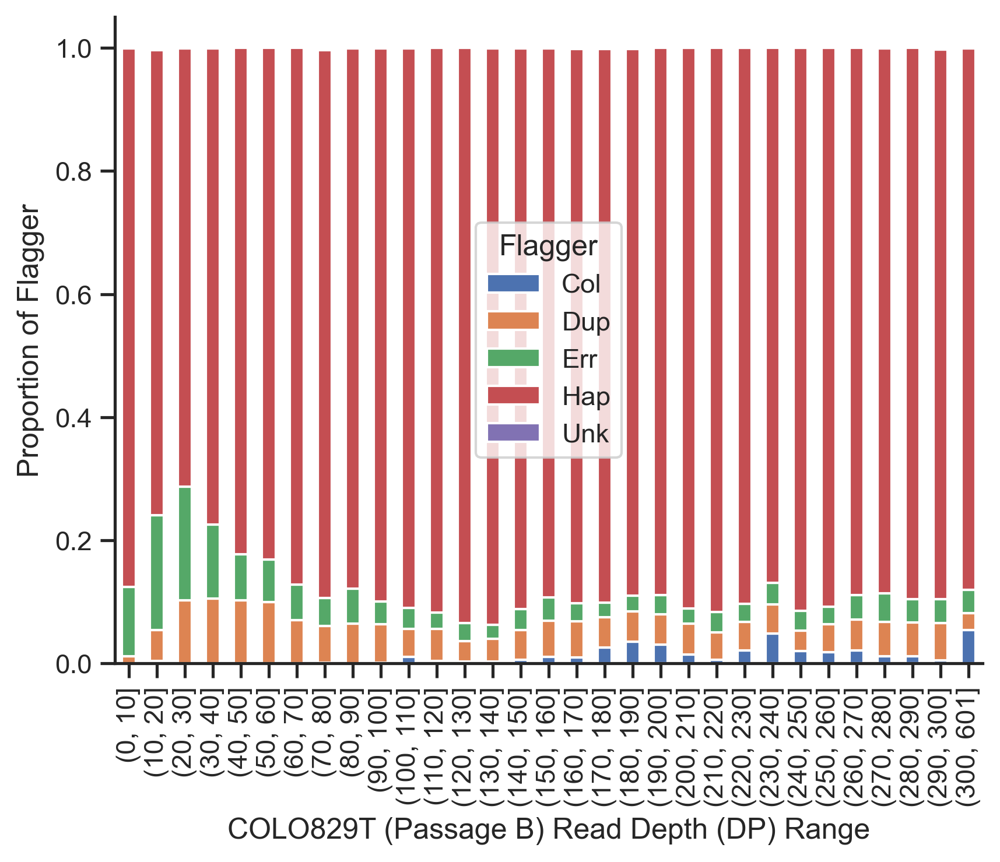

In [42]:
proportion_df = test2.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)
proportion_df = proportion_df.div(proportion_df.sum(axis=1), axis=0)
proportion_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Read Depth (DP) Range')
plt.ylabel('Proportion of Flagger')

/tmp/ipykernel_1311173/3357046005.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = test2.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)


Text(0, 0.5, 'Count of Flagger')

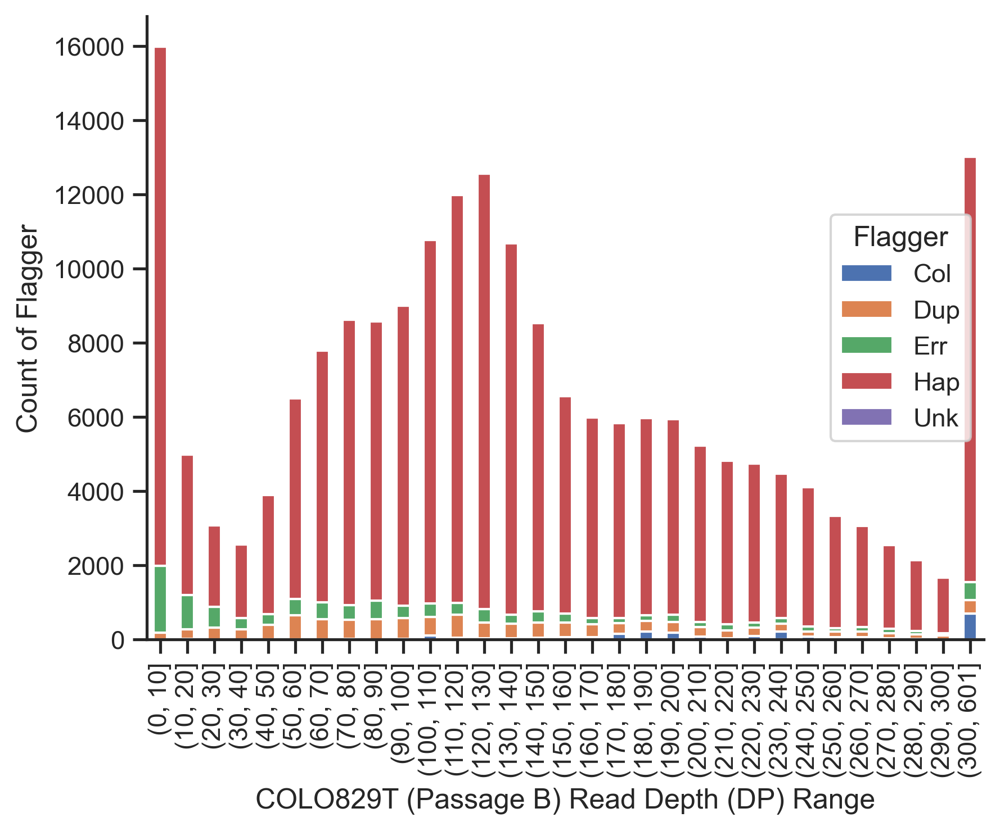

In [43]:
count_df = test2.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)
count_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Read Depth (DP) Range')
plt.ylabel('Count of Flagger')

In [45]:
# Germline filter (COLOBL AD≥10)
colotb_snvs_pass_annot_FlaggerHap = colotb_snvs_pass_annot[(colotb_snvs_pass_annot['Flagger'] == 'Hap')]
#colotb_snvs_pass_annot_FlaggerHap_GlFiltAD10 = colotb_snvs_pass_annot_FlaggerHap[(colotb_snvs_pass_annot_FlaggerHap['COLO829BL_Germline_ad10'] == 'Yes')]

In [46]:
colotb_snvs_pass_annot

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829T_PassageB_DSA,SNVid,Flagger,NucFreq
0,haplotype1-0000001,345669,.,C,T,65,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:59:133:2,131:0.984962:65,60,0",haplotype1-0000001_345669_C_T,Hap,NaN
1,haplotype1-0000001,381602,.,G,T,70.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:65:131:0,131:1:70,66,0",haplotype1-0000001_381602_G_T,Hap,NaN
2,haplotype1-0000001,436345,.,G,A,58.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:53:49:0,49:1:58,54,0",haplotype1-0000001_436345_G_A,Hap,NaN
3,haplotype1-0000001,493800,.,G,A,68.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:63:83:0,83:1:68,63,0",haplotype1-0000001_493800_G_A,Hap,NaN
4,haplotype1-0000001,547974,.,A,G,71.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:65:123:0,123:1:71,66,0",haplotype1-0000001_547974_A_G,Hap,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
205108,haplotype2-0000194,48714,.,T,C,46.5,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:21:20:0,20:1:46,21,0",haplotype2-0000194_48714_T_C,Dup,NaN
205109,haplotype2-0000194,49083,.,G,C,48,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:20:19:0,19:1:47,20,0",haplotype2-0000194_49083_G_C,Dup,NaN
205110,haplotype2-0000194,52592,.,A,G,53,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:31:10:0,10:1:52,30,0",haplotype2-0000194_52592_A_G,Dup,NaN
205111,haplotype2-0000194,52823,.,C,G,51.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:29:10:0,10:1:51,29,0",haplotype2-0000194_52823_C_G,Dup,NaN


In [48]:
"""
test3 = pd.concat([colotb_snvs_pass_annot_FlaggerHap['SNVid'], colotb_snvs_pass_annot_FlaggerHap['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), colotb_snvs_pass_annot_FlaggerHap['COLO829BL_Germline_ad10']], axis=1)

bins = list(range(0, 302, 10)) + [test3['COLO829T_PassageB_DSA'].max() + 1]
test3['Range'] = pd.cut(test3['COLO829T_PassageB_DSA'], bins=bins)
test3
"""

"\ntest3 = pd.concat([colotb_snvs_pass_annot_FlaggerHap['SNVid'], colotb_snvs_pass_annot_FlaggerHap['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), colotb_snvs_pass_annot_FlaggerHap['COLO829BL_Germline_ad10']], axis=1)\n\nbins = list(range(0, 302, 10)) + [test3['COLO829T_PassageB_DSA'].max() + 1]\ntest3['Range'] = pd.cut(test3['COLO829T_PassageB_DSA'], bins=bins)\ntest3\n"

In [50]:
"""proportion_df = test3.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)
proportion_df = proportion_df.div(proportion_df.sum(axis=1), axis=0)
proportion_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Read Depth (DP) Range')
plt.ylabel('Proportion of Germline Variants (AD≥10)')"""

"proportion_df = test3.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)\nproportion_df = proportion_df.div(proportion_df.sum(axis=1), axis=0)\nproportion_df.plot(kind='bar', stacked=True)\nplt.xlabel('COLO829T (Passage B) Read Depth (DP) Range')\nplt.ylabel('Proportion of Germline Variants (AD≥10)')"

In [51]:
"""count_df = test3.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)
count_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Read Depth (DP) Range')
plt.ylabel('Count of Germline Variants (AD≥10)')"""

"count_df = test3.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)\ncount_df.plot(kind='bar', stacked=True)\nplt.xlabel('COLO829T (Passage B) Read Depth (DP) Range')\nplt.ylabel('Count of Germline Variants (AD≥10)')"

In [53]:
"""test4 = pd.concat([colotb_snvs_pass_annot_FlaggerHap['SNVid'], colotb_snvs_pass_annot_FlaggerHap['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), colotb_snvs_pass_annot_FlaggerHap['COLO829BL_Germline_ad10']], axis=1)

bins = list(range(0, 302, 10)) + [test4['COLO829T_PassageB_DSA'].max() + 1]
test4['Range'] = pd.cut(test4['COLO829T_PassageB_DSA'], bins=bins)
test4"""

"test4 = pd.concat([colotb_snvs_pass_annot_FlaggerHap['SNVid'], colotb_snvs_pass_annot_FlaggerHap['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), colotb_snvs_pass_annot_FlaggerHap['COLO829BL_Germline_ad10']], axis=1)\n\nbins = list(range(0, 302, 10)) + [test4['COLO829T_PassageB_DSA'].max() + 1]\ntest4['Range'] = pd.cut(test4['COLO829T_PassageB_DSA'], bins=bins)\ntest4"

In [55]:
"""proportion_df = test4.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)
proportion_df = proportion_df.div(proportion_df.sum(axis=1), axis=0)
proportion_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Allelic Depth (AD) Range')
plt.ylabel('Proportion of Germline Variants (AD≥10)')"""

"proportion_df = test4.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)\nproportion_df = proportion_df.div(proportion_df.sum(axis=1), axis=0)\nproportion_df.plot(kind='bar', stacked=True)\nplt.xlabel('COLO829T (Passage B) Allelic Depth (AD) Range')\nplt.ylabel('Proportion of Germline Variants (AD≥10)')"

In [57]:
"""count_df = test4.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)
count_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Allelic Depth (AD) Range')
plt.ylabel('Count of Germline Variants (AD≥10)')"""

"count_df = test4.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)\ncount_df.plot(kind='bar', stacked=True)\nplt.xlabel('COLO829T (Passage B) Allelic Depth (AD) Range')\nplt.ylabel('Count of Germline Variants (AD≥10)')"

## Making VCF-based Filtering

In [58]:
colotb_snvs_pass_annot_FlaggerHap_glfilt = colotb_snvs_pass_annot[
    (colotb_snvs_pass_annot['SNVid'].isin(colot_glfilt_set)) & 
    (colotb_snvs_pass_annot['Flagger'] == 'Hap')
    ].reset_index(drop=True)

colota_snvs_pass_annot_FlaggerHap_glfilt = colota_snvs_pass_annot[
    (colota_snvs_pass_annot['SNVid'].isin(colot_glfilt_set)) & 
    (colota_snvs_pass_annot['Flagger'] == 'Hap')
    ].reset_index(drop=True)

## Making pileup files using bam-readcount

In [59]:
"""
make_site_list(colotb_snvs_pass_annot_FlaggerHap_glfilt, 
               f'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant', "COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt")

make_site_list(colota_snvs_pass_annot_FlaggerHap_glfilt, 
               f'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant', "COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt")
"""

'\nmake_site_list(colotb_snvs_pass_annot_FlaggerHap_glfilt, \n               f\'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant\', "COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt")\n\nmake_site_list(colota_snvs_pass_annot_FlaggerHap_glfilt, \n               f\'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant\', "COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt")\n'

In [60]:
# Time consuming
print(f"cat \
      {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
        {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
            | sort | uniq > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageBA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup")

"""
os.system(f"cat \
          {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
          {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
          | sort | uniq > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageBA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup")
"""

cat       /mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/Fiber-seq/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist         /mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/Fiber-seq/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist             | sort | uniq > /mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/Fiber-seq/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageBA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup


'\nos.system(f"cat           {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist           {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist           | sort | uniq > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageBA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup")\n'

In [61]:
# Time consuming
"""
os.system(
    f"bam-readcount \
        {dir}/COLO829BL/COLO829BL_DSA_resetmapq.cram \
        -l {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
        -f {DSA} \
        > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup"
)

os.system(
    f"bam-readcount \
        {dir}/COLO829BL/COLO829BL_DSA_resetmapq.cram \
        -l {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
        -f {DSA} \
        > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup"
)
"""

'\nos.system(\n    f"bam-readcount         {dir}/COLO829BL/COLO829BL_DSA_resetmapq.cram         -l {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist         -f {DSA}         > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup"\n)\n\nos.system(\n    f"bam-readcount         {dir}/COLO829BL/COLO829BL_DSA_resetmapq.cram         -l {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist         -f {DSA}         > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup"\n)\n'

## Pileup-based Germline Variants Filtering

In [62]:
with open(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup", 'r') as dfh:
    colotb_pileup_snvid_set = set()
    for i in dfh:
        for j in get_pileup_nonref_snvid_from_bamreadcount(i):
            colotb_pileup_snvid_set.add(j)

with open(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup", 'r') as dfh:
    colota_pileup_snvid_set = set()
    for i in dfh:
        for j in get_pileup_nonref_snvid_from_bamreadcount(i):
            colota_pileup_snvid_set.add(j)


In [63]:
print(len(colotb_pileup_snvid_set))
print(len(colota_pileup_snvid_set))

56892
85516


In [64]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt = colotb_snvs_pass_annot_FlaggerHap_glfilt[~colotb_snvs_pass_annot_FlaggerHap_glfilt['SNVid'].isin(colotb_pileup_snvid_set)].reset_index(drop=True)

colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt = colota_snvs_pass_annot_FlaggerHap_glfilt[~colota_snvs_pass_annot_FlaggerHap_glfilt['SNVid'].isin(colota_pileup_snvid_set)].reset_index(drop=True)

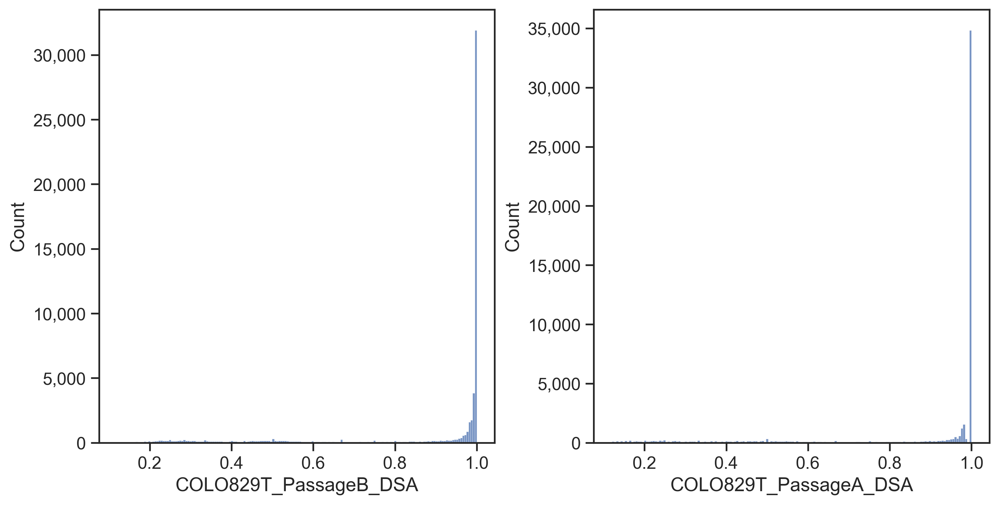

In [65]:
sns.set_theme(font="Arial", font_scale=1.15, style='ticks') 
matplotlib.rcParams['figure.dpi'] = 300
plt.rc("axes.spines", top=True, right=True)

fig, axes = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)
sns.histplot(vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF'), 
             kde=False, 
             ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF'), 
             kde=False, 
             ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

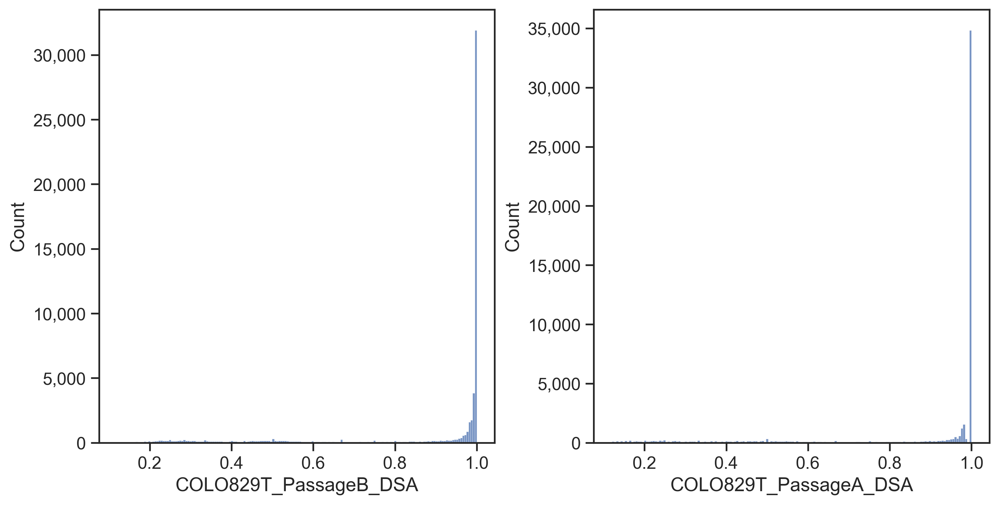

In [66]:
fig, axes = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)
sns.histplot(vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF'), 
             kde=False, 
             ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF'), 
             kde=False, 
             ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

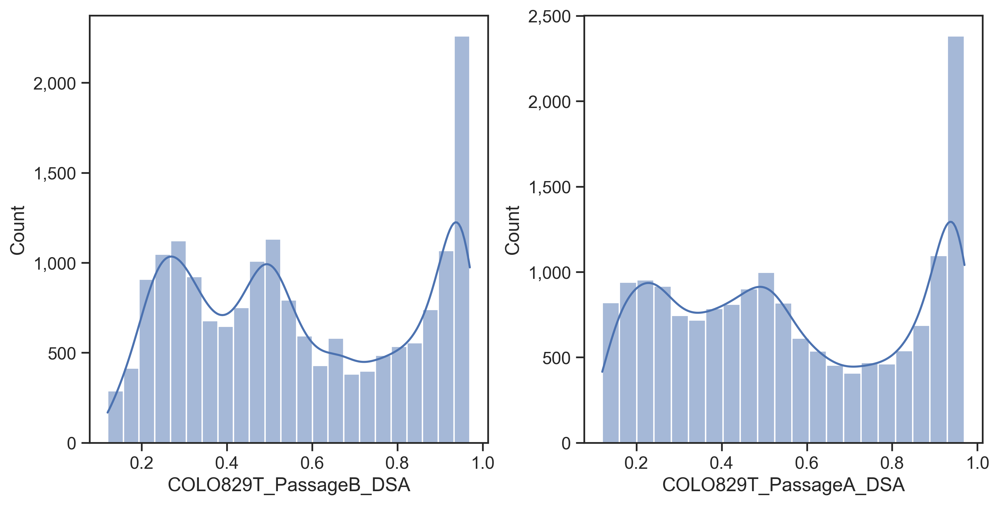

In [67]:
fig, axes = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)
sns.histplot(vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF')[vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF') <= 0.97], 
             kde=True, 
             ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF')[vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF') <= 0.97], 
             kde=True, 
             ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

In [68]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set = set(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].values)
colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set = set(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].values)

tba_FlaggerHap_glfilt_pileupfilt_tba_set = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set.intersection(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set)
tb_FlaggerHap_glfilt_pileupfilt_onlytb_set = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set.difference(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set)
ta_FlaggerHap_glfilt_pileupfilt_onlyta_set = colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set.difference(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set)

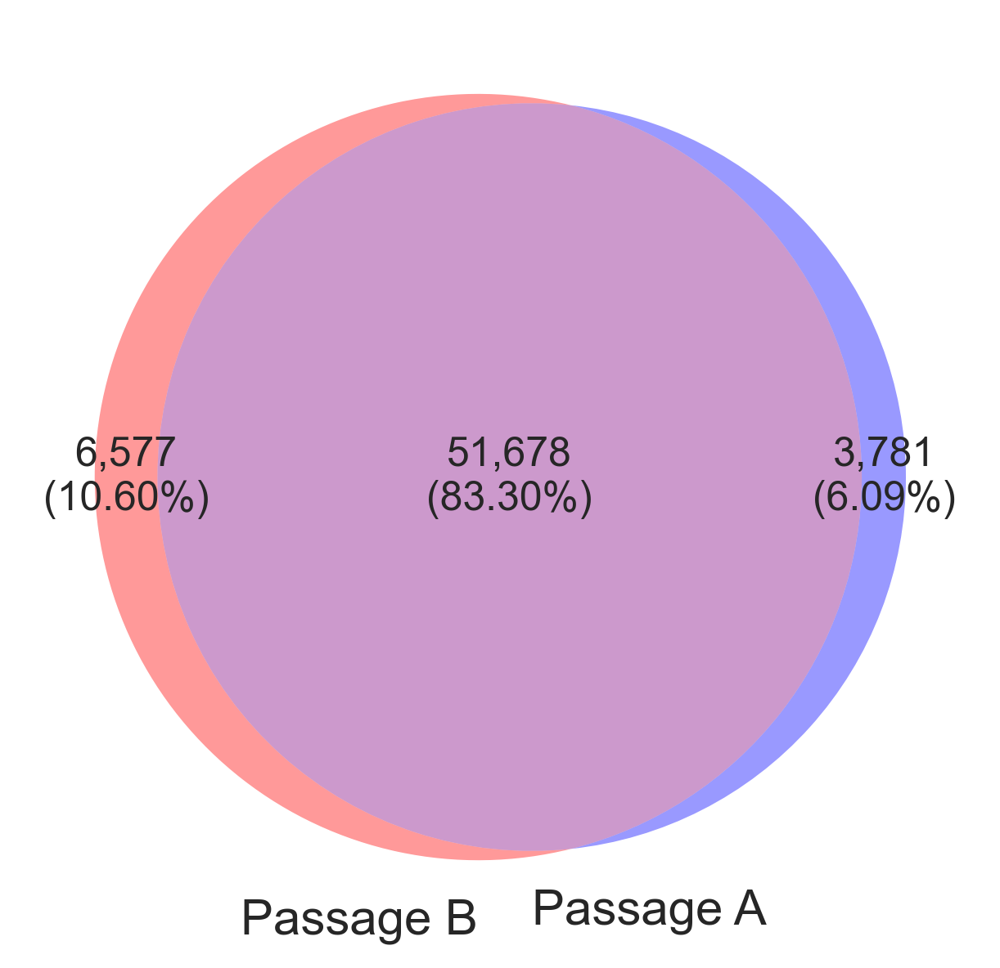

In [ ]:
sns.set_theme(font="Arial", font_scale=1.00, style='ticks')
matplotlib.rcParams['figure.dpi'] = 300
plt.rc("axes.spines", top=False, right=False)

total = len((colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set.union(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set)))
venn = venn2([colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set, colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set], 
             ('Passage B', 'Passage A'),
             subset_label_formatter=lambda x: f"{x:,}\n({(x/total):.2%})")
venn.get_patch_by_id('10').set_color('red')
venn.get_patch_by_id('01').set_color('blue')
venn.get_patch_by_id('11').set_color('purple')

for i in ['10', '01', '11']:
    venn.get_patch_by_id(i).set_edgecolor('none')
    venn.get_patch_by_id(i).set_alpha(0.4)

In [70]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_tb_vaf = vcf_format_getter(
    colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)], 
    'VAF')

colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_ta_vaf = vcf_format_getter(
    colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)], 
    'VAF')

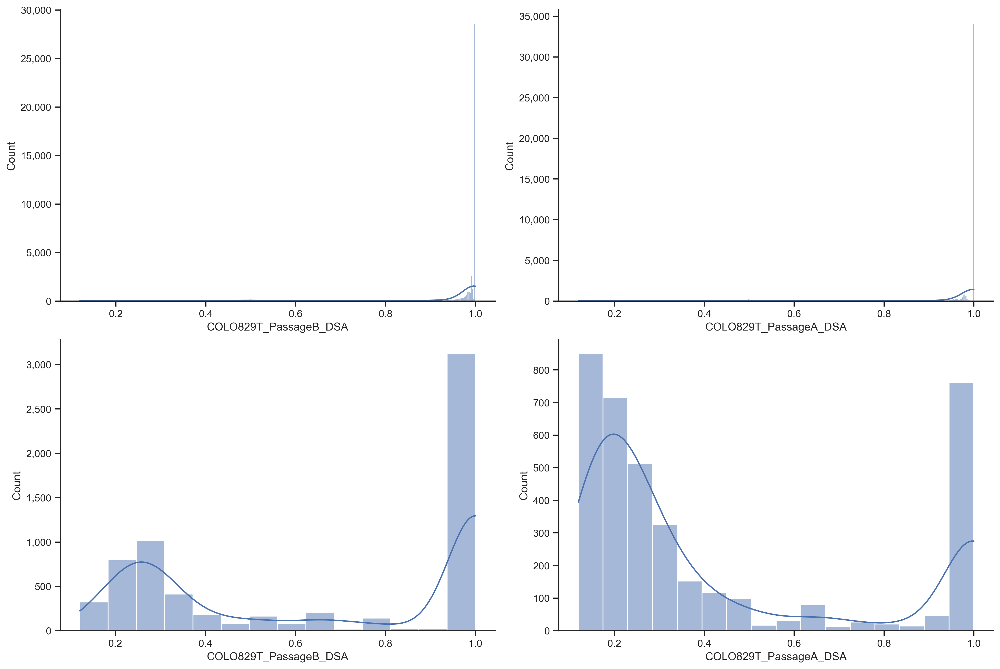

In [71]:
fig, axes = plt.subplots(2,2, figsize=(15,10), constrained_layout=True)
sns.histplot(
    colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_tb_vaf, 
    kde=True, 
    ax=axes[0, 0])
axes[0, 0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.histplot(
    colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_ta_vaf, 
    kde=True, 
    ax=axes[0, 1])
axes[0, 1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.histplot(
    vcf_format_getter(
    colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tb_FlaggerHap_glfilt_pileupfilt_onlytb_set)], 
    'VAF'), 
    kde=True, 
    ax=axes[1, 0])
axes[1, 0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(
    vcf_format_getter(
    colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(ta_FlaggerHap_glfilt_pileupfilt_onlyta_set)], 
    'VAF'), 
    kde=True, 
    ax=axes[1, 1])
axes[1, 1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))


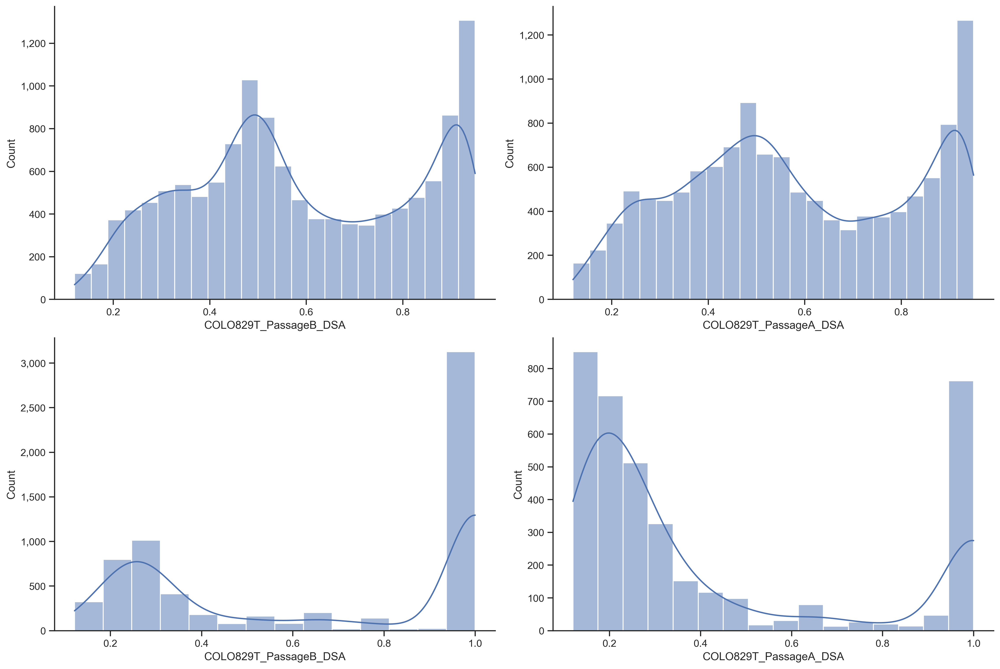

In [72]:
fig, axes = plt.subplots(2,2, figsize=(15,10), constrained_layout=True)
sns.histplot(
    colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_tb_vaf[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_tb_vaf <= 0.95], 
    kde=True, 
    ax=axes[0, 0])
axes[0, 0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.histplot(
    colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_ta_vaf[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_ta_vaf <= 0.95], 
    kde=True, 
    ax=axes[0, 1])
axes[0, 1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.histplot(
    vcf_format_getter(
    colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tb_FlaggerHap_glfilt_pileupfilt_onlytb_set)], 
    'VAF'), 
    kde=True, 
    ax=axes[1, 0])
axes[1, 0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(
    vcf_format_getter(
    colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(ta_FlaggerHap_glfilt_pileupfilt_onlyta_set)], 
    'VAF'), 
    kde=True, 
    ax=axes[1, 1])
axes[1, 1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))


In [73]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)].reset_index(drop=True)

colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba = colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)].reset_index(drop=True)


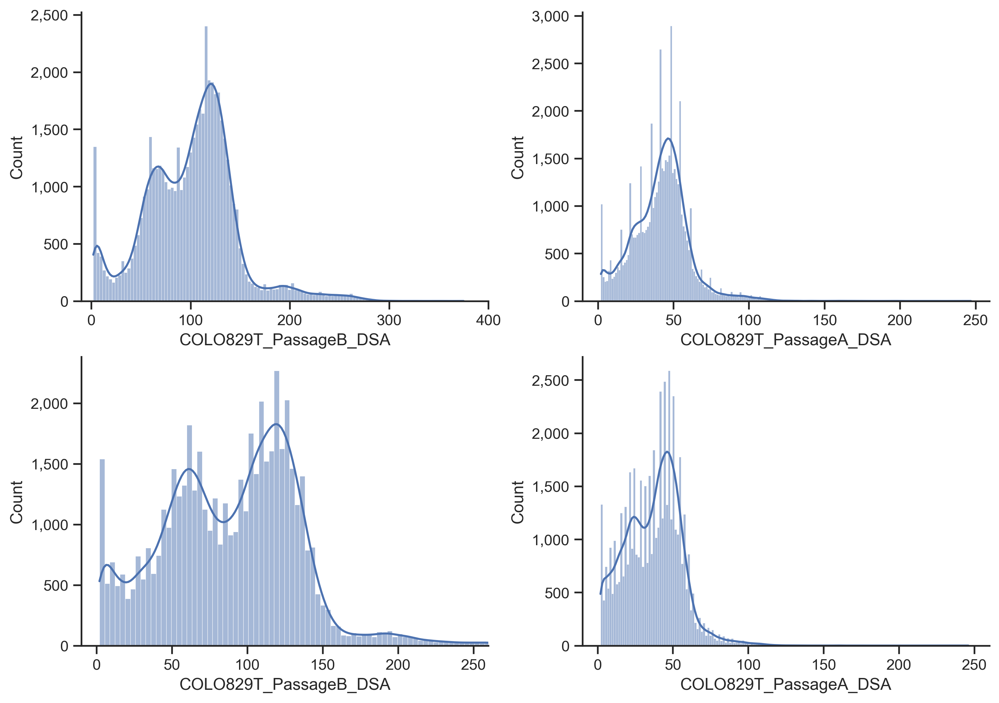

In [74]:
fig, axes = plt.subplots(2,2, figsize=(10,7), constrained_layout=True)
sns.histplot(vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "DP"), kde=True, ax=axes[0,0])
sns.histplot(vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "DP"), kde=True, ax=axes[0,1])
sns.histplot(vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "AD"), kde=True, ax=axes[1,0])
sns.histplot(vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "AD"), kde=True, ax=axes[1,1])
axes[0,0].set_xlim(-10,400)
axes[1,0].set_xlim(-10,400)
axes[1,0].set_xlim(-10,260)
axes[1,1].set_xlim(-10,260)

axes[0,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))


In [75]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba['VCF_DP'] = vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "DP")
colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba['VCF_DP'] = vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "DP")

colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba['VCF_DP'] <= 2]

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829T_PassageB_DSA,SNVid,Flagger,NucFreq,VCF_DP
6468,haplotype1-0000008,50005219,.,C,A,36.1,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:6:2:0,2:1:34,5,0",haplotype1-0000008_50005219_C_A,Hap,NaN,2
6476,haplotype1-0000008,57187004,.,G,A,34.1,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:33,5,0",haplotype1-0000008_57187004_G_A,Hap,NaN,2
21482,haplotype1-0000021,36436739,.,G,C,30,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:8:2:0,2:1:29,6,0",haplotype1-0000021_36436739_G_C,Hap,NaN,2
21483,haplotype1-0000021,36436743,.,G,T,30.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:29,6,0",haplotype1-0000021_36436743_G_T,Hap,NaN,2
21484,haplotype1-0000021,36436764,.,A,G,30.6,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:29,6,0",haplotype1-0000021_36436764_A_G,Hap,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46667,haplotype2-0000073,79674169,.,G,A,34.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:33,5,0",haplotype2-0000073_79674169_G_A,Hap,NaN,2
46671,haplotype2-0000073,79821404,.,G,A,29.6,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:28,6,0",haplotype2-0000073_79821404_G_A,Hap,NaN,2
46672,haplotype2-0000073,79821405,.,G,A,24.5,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:23,6,0",haplotype2-0000073_79821405_G_A,Hap,NaN,2
46673,haplotype2-0000073,79827179,.,C,A,36.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:35,5,0",haplotype2-0000073_79827179_C_A,Hap,NaN,2


## Making VCF

In [76]:
"""
# tb all
pre_vcf = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt.iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.vcf.gz")

# ta all
pre_vcf = colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt.iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.vcf.gz")

# TBA tb
pre_vcf = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)].iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.tba.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.tba.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.tba.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.tba.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.tba.vcf.gz")

# TBA ta
pre_vcf = colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)].iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.tba.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.tba.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.tba.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.tba.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.tba.vcf.gz")

# Only tb
pre_vcf = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tb_FlaggerHap_glfilt_pileupfilt_onlytb_set)].iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.onlytb.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.onlytb.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.onlytb.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.onlytb.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.onlytb.vcf.gz")

# Only ta
pre_vcf = colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(ta_FlaggerHap_glfilt_pileupfilt_onlyta_set)].iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.onlyta.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.onlyta.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.onlyta.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.onlyta.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.onlyta.vcf.gz")
"""

'\n# tb all\npre_vcf = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt.iloc[:, :10].rename(columns={"CHROM": "#CHROM"})\npre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.vcf", sep=\'\t\', index=False)\n\nos.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.vcf")\n\nos.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.vcf.gz")\n\n# ta all\npre_vcf = colota_snvs_pass_annot_FlaggerHap_g

## Make input files for karyotypeR

In [77]:
# To dos

## Orthogonal Validation using UL-ONT (and ONT)

In [78]:
"""
make_site_list(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 
               f'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant', 
               "COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt_pileupfilt")

make_site_list(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 
               f'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant', 
               "COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt_pileupfilt")

dir=/mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/Fiber-seq/VariantCalls_DeepVariant_1.6.1

os.system(f"cat ${dir}/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt_pileupfilt.sitelist \
    {dir}/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt_pileupfilt.sitelist \
        | sort -k1,1 -k2,2n - | uniq \
            > ${dir}/COLO829T_PassageCombined_DSA.sitelist") # ${dir}/_sitelist_merge.sh

"""

'\nmake_site_list(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, \n               f\'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant\', \n               "COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt_pileupfilt")\n\nmake_site_list(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, \n               f\'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant\', \n               "COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt_pileupfilt")\n\ndir=/mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/Fiber-seq/VariantCalls_DeepVariant_1.6.1\n\nos.system(f"cat ${dir}/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt_pileupfilt.sitelist     {dir}/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt_pileupfilt.sitelist         | sort -k1,1 -k2,2n - | uniq        

Execute _bcftools_pick_variant_type.sh

In [79]:
ontdir="/mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/ONT"

colobl_snvs_ont = read_vcf(f"{ontdir}/ONT/COLO829BL_ONT_DSA.pileup.split.snv.vcf.gz")
colota_snvs_ont = read_vcf(f"{ontdir}/ONT/COLO829T_PassageA_ONT_DSA.pileup.split.snv.vcf.gz")
colotb_snvs_ont = read_vcf(f"{ontdir}/ONT/COLO829T_PassageB_ONT_DSA.pileup.split.snv.vcf.gz")
colobl_snvs_uont = read_vcf(f"{ontdir}/UL-ONT/COLO829BL_UONT_DSA.pileup.split.snv.vcf.gz")
colotb_snvs_uont = read_vcf(f"{ontdir}/UL-ONT/COLO829T_PassageB_UONT_DSA.pileup.split.snv.vcf.gz")

colobl_snvs_ont['SNVid'] = colobl_snvs_ont[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colota_snvs_ont['SNVid'] = colota_snvs_ont[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colotb_snvs_ont['SNVid'] = colotb_snvs_ont[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colobl_snvs_uont['SNVid'] = colobl_snvs_uont[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colotb_snvs_uont['SNVid'] = colotb_snvs_uont[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)

In [80]:
def ont_vcf_parser(df, target: str) -> pd.Series:
	sampleid = df.columns[9]
	format = list(set(df['FORMAT'].values))[0].split(':')
	if target == "AD":
		adindex = format.index('AD')
		return df[sampleid].str.split(':').apply(lambda x: int(x[adindex].split(',')[1]))
	
	elif target == "DP":
		return df['INFO'].apply(lambda x: int(vcf_info_parser(x)["DP"]))

def get_vaf_from_ont_vcf(df: pd.core.frame.DataFrame) -> pd.Series:
	return ont_vcf_parser(df, "AD") / ont_vcf_parser(df, "DP")
	

In [81]:
#sns.histplot(get_vaf_from_ont_vcf(colotb_snvs_uont), kde=True)

In [82]:
#tba_FlaggerHap_glfilt_pileupfilt_tba_set.union(tb_FlaggerHap_glfilt_pileupfilt_onlytb_set).union(ta_FlaggerHap_glfilt_pileupfilt_onlyta_set)
#colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba

snvid_tba = pd.DataFrame(tba_FlaggerHap_glfilt_pileupfilt_tba_set, columns=['SNVid'])
snvid_tba['Category'] = 'Shared'
snvid_onlytb = pd.DataFrame(tb_FlaggerHap_glfilt_pileupfilt_onlytb_set, columns=['SNVid'])
snvid_onlytb['Category'] = 'B Specific'
snvid_onlyta = pd.DataFrame(ta_FlaggerHap_glfilt_pileupfilt_onlyta_set, columns=['SNVid'])
snvid_onlyta['Category'] = 'A Specific'

snvid_somaticsnv_template = pd.concat([snvid_tba, snvid_onlytb, snvid_onlyta], axis=0).reset_index(drop=True)
snvid_somaticsnv_template

,SNVid,Category
0,haplotype1-0000015_29847110_C_T,Shared
1,haplotype1-0000002_97851324_G_A,Shared
2,haplotype1-0000013_44074343_A_G,Shared
3,haplotype1-0000019_67618179_C_T,Shared
4,haplotype1-0000004_122331141_C_A,Shared
...,...,...
62031,haplotype2-0000048_58291101_T_C,A Specific
62032,haplotype1-0000005_13587980_G_A,A Specific
62033,haplotype2-0000073_51280769_C_T,A Specific
62034,haplotype2-0000053_18757538_A_T,A Specific


In [83]:
#get_vaf_from_ont_vcf(colotb_snvs_uont)

SNV_VAF_Combined = snvid_somaticsnv_template.merge(
    pd.concat([colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'], 
               vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, "VAF"),
               vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, "DP"),
               vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, "AD")], 
               axis=1, keys=['SNVid', 'Passage B (HiFi) VAF', 'Passage B (HiFi) DP', 'Passage B (HiFi) AD']), how='left').merge(
    pd.concat([colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'], 
               vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, "VAF"),
               vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, "DP"),
               vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, "AD")], 
               axis=1, keys=['SNVid', 'Passage A (HiFi) VAF', 'Passage A (HiFi) DP', 'Passage A (HiFi) AD']), how='left').merge(
    pd.concat([colotb_snvs_uont['SNVid'], 
               get_vaf_from_ont_vcf(colotb_snvs_uont),
               ont_vcf_parser(colotb_snvs_uont, "DP"),
               ont_vcf_parser(colotb_snvs_uont, "AD")], 
               axis=1, keys=['SNVid', 'Passage B (UL-ONT) VAF', 'Passage B (UL-ONT) DP', 'Passage B (UL-ONT) AD']), how='left').merge(
    pd.concat([colotb_snvs_ont['SNVid'], 
               get_vaf_from_ont_vcf(colotb_snvs_ont),
               ont_vcf_parser(colotb_snvs_ont, "DP"),
               ont_vcf_parser(colotb_snvs_ont, "AD")], 
               axis=1, keys=['SNVid', 'Passage B (ONT) VAF', 'Passage B (ONT) DP', 'Passage B (ONT) AD']), how='left').merge(
    pd.concat([colota_snvs_ont['SNVid'], 
               get_vaf_from_ont_vcf(colota_snvs_ont),
               ont_vcf_parser(colota_snvs_ont, "DP"),
               ont_vcf_parser(colota_snvs_ont, "AD")], 
               axis=1, keys=['SNVid', 'Passage A (ONT) VAF', 'Passage A (ONT) DP', 'Passage A (ONT) AD']), how='left')

SNV_VAF_Combined

,SNVid,Category,Passage B (HiFi) VAF,Passage B (HiFi) DP,Passage B (HiFi) AD,Passage A (HiFi) VAF,Passage A (HiFi) DP,Passage A (HiFi) AD,Passage B (UL-ONT) VAF,Passage B (UL-ONT) DP,Passage B (UL-ONT) AD,Passage B (ONT) VAF,Passage B (ONT) DP,Passage B (ONT) AD,Passage A (ONT) VAF,Passage A (ONT) DP,Passage A (ONT) AD
0,haplotype1-0000015_29847110_C_T,Shared,0.990826,109.0,108.0,0.933333,45.0,42.0,0.900000,20.0,18.0,0.968750,32.0,31.0,0.936170,47.0,44.0
1,haplotype1-0000002_97851324_G_A,Shared,1.000000,62.0,62.0,1.000000,33.0,33.0,0.777778,9.0,7.0,1.000000,20.0,20.0,1.000000,37.0,37.0
2,haplotype1-0000013_44074343_A_G,Shared,1.000000,129.0,129.0,1.000000,49.0,49.0,0.964286,28.0,27.0,0.925926,27.0,25.0,0.900000,60.0,54.0
3,haplotype1-0000019_67618179_C_T,Shared,1.000000,131.0,131.0,1.000000,45.0,45.0,0.928571,28.0,26.0,0.965517,29.0,28.0,0.950820,61.0,58.0
4,haplotype1-0000004_122331141_C_A,Shared,1.000000,87.0,87.0,1.000000,46.0,46.0,1.000000,17.0,17.0,0.966667,30.0,29.0,1.000000,40.0,40.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62031,haplotype2-0000048_58291101_T_C,A Specific,NaN,NaN,NaN,0.250000,44.0,11.0,0.185185,27.0,5.0,0.171429,35.0,6.0,0.062500,48.0,3.0
62032,haplotype1-0000005_13587980_G_A,A Specific,NaN,NaN,NaN,0.177778,45.0,8.0,NaN,NaN,NaN,0.083333,36.0,3.0,0.097561,41.0,4.0
62033,haplotype2-0000073_51280769_C_T,A Specific,NaN,NaN,NaN,1.000000,8.0,8.0,1.000000,3.0,3.0,NaN,NaN,NaN,0.866667,15.0,13.0
62034,haplotype2-0000053_18757538_A_T,A Specific,NaN,NaN,NaN,0.200000,20.0,4.0,0.090909,11.0,1.0,NaN,NaN,NaN,0.047619,21.0,1.0


In [84]:
sns.set_theme(font="Arial", font_scale=1.15, style='ticks') 
matplotlib.rcParams['figure.dpi'] = 150
plt.rc("axes.spines", top=True, right=True)

palette_variantclass = {'Shared': 'purple',
                        'B Specific': 'red',
                        'A Specific': 'blue'}

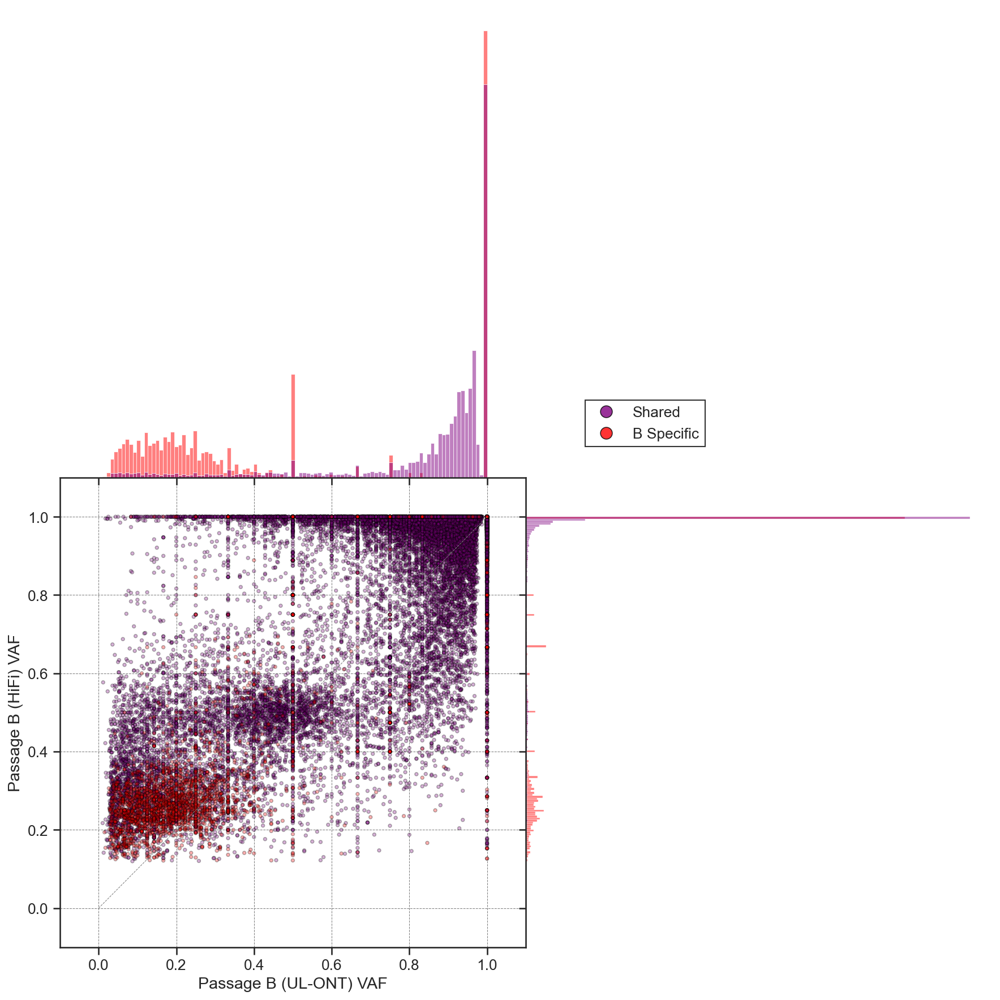

In [85]:
g = sns.JointGrid(data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], x="Passage B (UL-ONT) VAF", y="Passage B (HiFi) VAF", space=0, height=12, ratio=1)
g = g.plot_joint(sns.scatterplot, data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], s=8, alpha=0.3, edgecolor='black', linewidth=0.75, hue="Category", palette=palette_variantclass)
g = g.plot_marginals(sns.histplot, data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], hue='Category', stat='probability', common_norm=False, kde=False, palette=palette_variantclass)

g.ax_joint.grid(True, which='both', color='grey', linestyle='--', linewidth=0.5)
g.ax_joint.plot([0, 1], [0, 1], color='grey', linestyle='--', linewidth=0.5)

g.ax_joint.set_xlim(-0.1, 1.1)
g.ax_joint.set_ylim(-0.1, 1.1)

legend_handles, legend_labels = g.ax_joint.get_legend_handles_labels()
for handle in legend_handles:
    handle.set_markersize(10)
    handle.set_alpha(0.8)

g.ax_joint.legend(handles=legend_handles, labels=legend_labels, edgecolor='black', fancybox=False, loc='lower right', bbox_to_anchor=(1.4, 1.05))

41,712


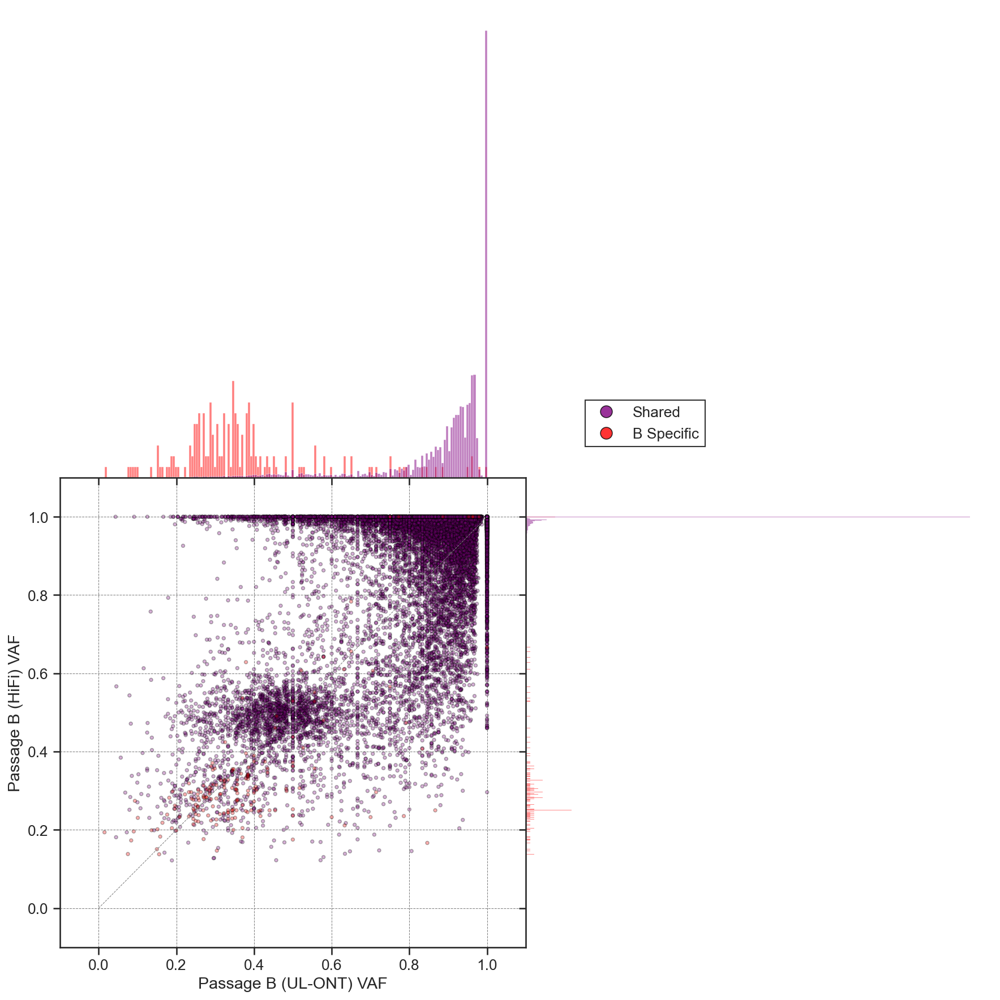

In [86]:
print(f'{SNV_VAF_Combined[(SNV_VAF_Combined['Category'] != "A Specific") & (SNV_VAF_Combined["Passage B (UL-ONT) AD"] >= 10)].shape[0]:,}')

g = sns.JointGrid(data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] != "A Specific") & (SNV_VAF_Combined["Passage B (UL-ONT) AD"] >= 10)], x="Passage B (UL-ONT) VAF", y="Passage B (HiFi) VAF", space=0, height=12, ratio=1)
g = g.plot_joint(sns.scatterplot, data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] != "A Specific") & (SNV_VAF_Combined["Passage B (UL-ONT) AD"] >= 10)], s=8, alpha=0.3, edgecolor='black', linewidth=0.75, hue="Category", palette=palette_variantclass)
g = g.plot_marginals(sns.histplot, data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] != "A Specific") & (SNV_VAF_Combined["Passage B (UL-ONT) AD"] >= 10)], hue='Category', stat='probability', common_norm=False, kde=False, palette=palette_variantclass)

g.ax_joint.grid(True, which='both', color='grey', linestyle='--', linewidth=0.5)
g.ax_joint.plot([0, 1], [0, 1], color='grey', linestyle='--', linewidth=0.5)

g.ax_joint.set_xlim(-0.1, 1.1)
g.ax_joint.set_ylim(-0.1, 1.1)

legend_handles, legend_labels = g.ax_joint.get_legend_handles_labels()
for handle in legend_handles:
    handle.set_markersize(10)
    handle.set_alpha(0.8)

g.ax_joint.legend(handles=legend_handles, labels=legend_labels, edgecolor='black', fancybox=False, loc='lower right', bbox_to_anchor=(1.4, 1.05))

In [87]:
"""Contour Plot
g = sns.jointplot(data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], 
                  x="Passage B (UL-ONT) VAF", 
                  y="Passage B (HiFi) VAF", 
                  hue="Category", 
                  kind="kde", 
                  levels=20,
                  palette=palette_variantclass)

g.ax_joint.grid(True, which='both', color='grey', linestyle='--', linewidth=0.5)
g.ax_joint.plot([0, 1], [0, 1], color='grey', linestyle='--', linewidth=0.5)

g.ax_joint.set_xlim(0, 1)
g.ax_joint.set_ylim(0, 1)

legend_handles, legend_labels = g.ax_joint.get_legend_handles_labels()
g.ax_joint.legend(handles=legend_handles, labels=legend_labels, edgecolor='black', fancybox=False, loc='lower right', bbox_to_anchor=(1.4, 1.05))
"""

'Contour Plot\ng = sns.jointplot(data=SNV_VAF_Combined[SNV_VAF_Combined[\'Category\'] != "A Specific"], \n                  x="Passage B (UL-ONT) VAF", \n                  y="Passage B (HiFi) VAF", \n                  hue="Category", \n                  kind="kde", \n                  levels=20,\n                  palette=palette_variantclass)\n\ng.ax_joint.grid(True, which=\'both\', color=\'grey\', linestyle=\'--\', linewidth=0.5)\ng.ax_joint.plot([0, 1], [0, 1], color=\'grey\', linestyle=\'--\', linewidth=0.5)\n\ng.ax_joint.set_xlim(0, 1)\ng.ax_joint.set_ylim(0, 1)\n\nlegend_handles, legend_labels = g.ax_joint.get_legend_handles_labels()\ng.ax_joint.legend(handles=legend_handles, labels=legend_labels, edgecolor=\'black\', fancybox=False, loc=\'lower right\', bbox_to_anchor=(1.4, 1.05))\n'

In [118]:
#test1 = pd.DataFrame({'first': [1, 4, np.nan, 5]})
#test2 = pd.DataFrame({'second': [5, np.nan, 1, 7]})
#test = pd.concat([test1, test2], axis=1)
#sns.scatterplot(data=test, x='first', y='second')
#print(test)

SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"][['Passage B (UL-ONT) VAF', 'Passage B (HiFi) VAF']].dropna()

SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "B Specific"][['Passage B (UL-ONT) VAF', 'Passage B (HiFi) VAF']].dropna()

,Passage B (UL-ONT) VAF,Passage B (HiFi) VAF
51679,0.086957,0.229167
51680,0.076923,0.229167
51682,0.136364,0.300000
51685,1.000000,1.000000
51687,0.391304,0.538462
...,...,...
58248,1.000000,1.000000
58249,0.333333,0.347826
58250,0.181818,0.210526
58253,1.000000,1.000000


## Passage B variants (Shared + B specific): Passage B (HiFi) VAF - Passage B (UL-ONT) VAF

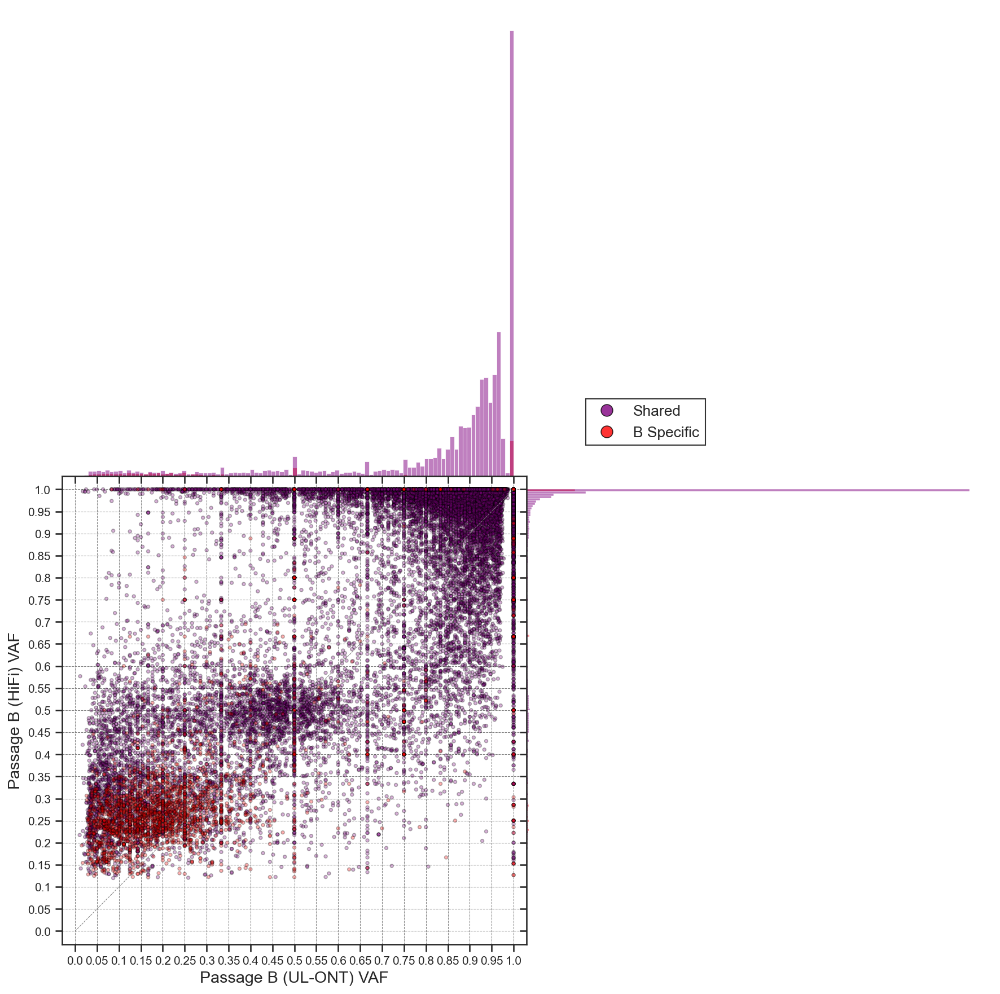

In [110]:
g = sns.JointGrid(data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], x="Passage B (UL-ONT) VAF", y="Passage B (HiFi) VAF", space=0, height=12, ratio=1)
g = g.plot_joint(sns.scatterplot, data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], s=8, alpha=0.3, edgecolor='black', linewidth=0.75, hue="Category", palette=palette_variantclass)
g.ax_joint.set_xticks([round(0.05*x, 2) for x in range(0, 21)])
g.ax_joint.set_yticks([round(0.05*y, 2) for y in range(0, 21)])

g.ax_joint.set_xticklabels(g.ax_joint.get_xticks(), fontsize=10)
g.ax_joint.set_yticklabels(g.ax_joint.get_yticks(), fontsize=10)

g = g.plot_marginals(sns.histplot, data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], hue='Category', stat='count', kde=False, palette=palette_variantclass)

g.ax_joint.grid(True, which='both', color='grey', linestyle='--', linewidth=0.5)
g.ax_joint.plot([0, 1], [0, 1], color='grey', linestyle='--', linewidth=0.5)

g.ax_joint.set_xlim(-0.03, 1.03)
g.ax_joint.set_ylim(-0.03, 1.03)

legend_handles, legend_labels = g.ax_joint.get_legend_handles_labels()
for handle in legend_handles:
    handle.set_markersize(10)
    handle.set_alpha(0.8)

g.ax_joint.legend(handles=legend_handles, labels=legend_labels, edgecolor='black', fancybox=False, loc='lower right', bbox_to_anchor=(1.4, 1.05))

## Passage A variants (Shared + A specific): Passage A (HiFi) VAF - Passage A (ONT) VAF

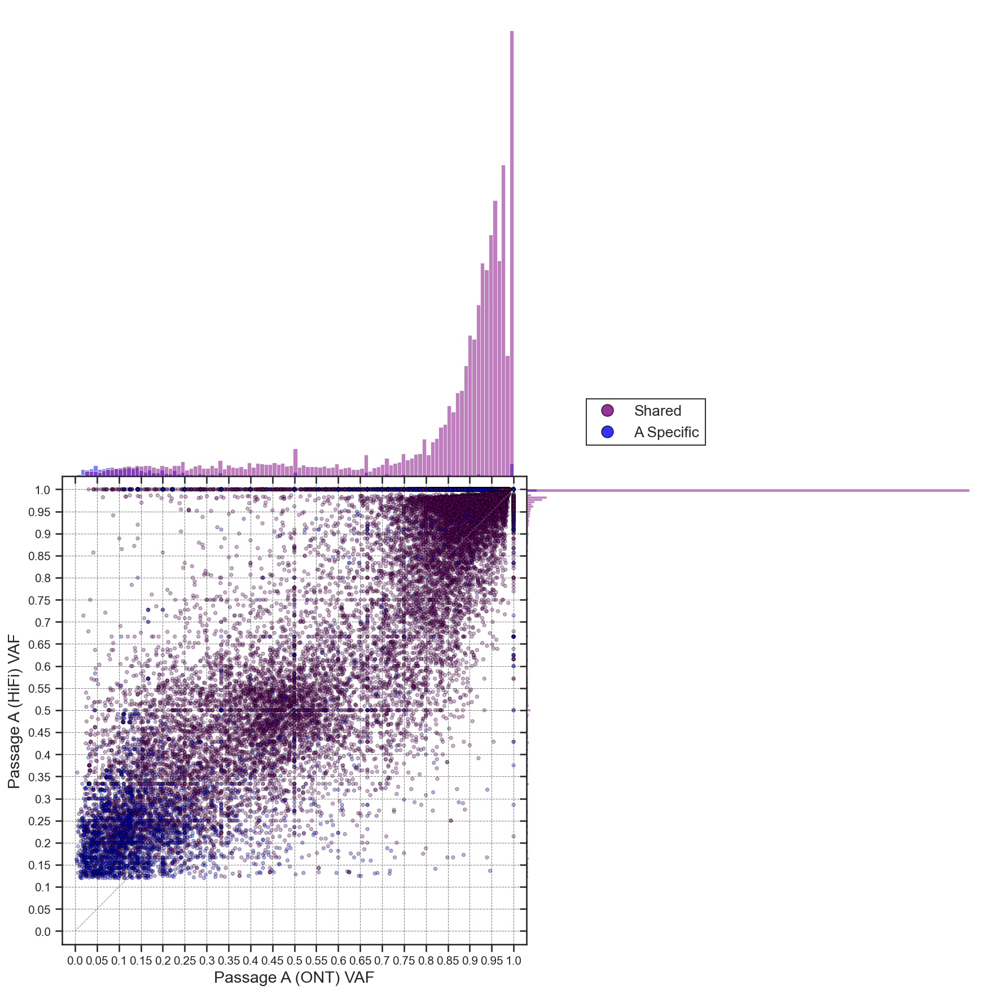

In [108]:
g = sns.JointGrid(data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "B Specific"], x="Passage A (ONT) VAF", y="Passage A (HiFi) VAF", space=0, height=12, ratio=1)
g = g.plot_joint(sns.scatterplot, data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "B Specific"], s=8, alpha=0.3, edgecolor='black', linewidth=0.75, hue="Category", palette=palette_variantclass)
g.ax_joint.set_xticks([round(0.05*x, 2) for x in range(0, 21)])
g.ax_joint.set_yticks([round(0.05*y, 2) for y in range(0, 21)])

g.ax_joint.set_xticklabels(g.ax_joint.get_xticks(), fontsize=10)
g.ax_joint.set_yticklabels(g.ax_joint.get_yticks(), fontsize=10)

g = g.plot_marginals(sns.histplot, data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "B Specific"], hue='Category', stat='count', kde=False, palette=palette_variantclass)

g.ax_joint.grid(True, which='both', color='grey', linestyle='--', linewidth=0.5)
g.ax_joint.plot([0, 1], [0, 1], color='grey', linestyle='--', linewidth=0.5)

g.ax_joint.set_xlim(-0.03, 1.03)
g.ax_joint.set_ylim(-0.03, 1.03)

legend_handles, legend_labels = g.ax_joint.get_legend_handles_labels()
for handle in legend_handles:
    handle.set_markersize(10)
    handle.set_alpha(0.8)

g.ax_joint.legend(handles=legend_handles, labels=legend_labels, edgecolor='black', fancybox=False, loc='lower right', bbox_to_anchor=(1.4, 1.05))

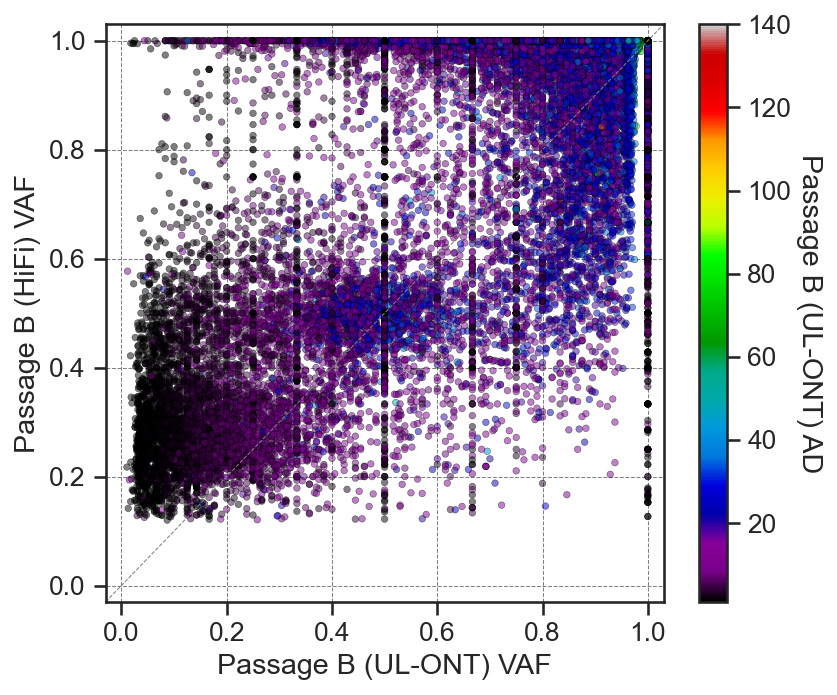

In [90]:
fig, ax = plt.subplots(1,1, figsize=(6,5))

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage B (UL-ONT) AD",
                palette='nipy_spectral', 
                s=10,
                alpha=0.5,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], 
                ax=ax)

ax.set_xlim(-0.03, 1.03)
ax.set_ylim(-0.03, 1.03)
ax.grid(True, which='both', color='grey', linestyle='--', linewidth=0.5)
ax.axline((0, 0), slope=1, linestyle='--', linewidth=0.5, color='grey')

norm = plt.Normalize(SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"]["Passage B (UL-ONT) AD"].min(), SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"]["Passage B (UL-ONT) AD"].max())
sm = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm)
sm.set_array([])

ax.get_legend().remove()

cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Passage B (UL-ONT) AD', rotation=270, labelpad=15)

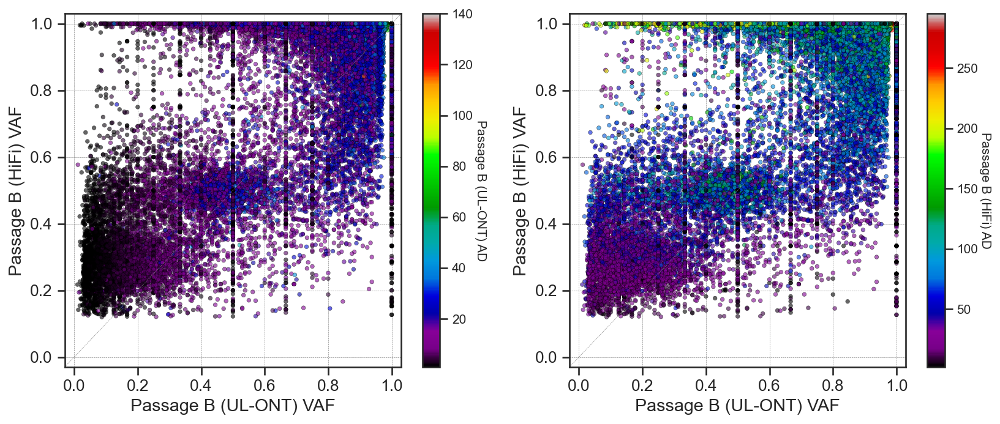

In [91]:
fig, ax = plt.subplots(1,2, figsize=(13,5))

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage B (UL-ONT) AD",
                palette='nipy_spectral', 
                s=10,
                alpha=0.6,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], 
                ax=ax[0])

ax[0].set_xlim(-0.03, 1.03)
ax[0].set_ylim(-0.03, 1.03)
ax[0].grid(True, which='both', color='grey', linestyle='--', linewidth=0.3)
ax[0].axline((0, 0), slope=1, linestyle='--', linewidth=0.3, color='grey')

norm1 = plt.Normalize(SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"]["Passage B (UL-ONT) AD"].min(), SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"]["Passage B (UL-ONT) AD"].max())
sm1 = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm1)
sm1.set_array([])

ax[0].get_legend().remove()

cbar1 = fig.colorbar(sm1, ax=ax[0])
cbar1.set_label('Passage B (UL-ONT) AD', fontsize=10, rotation=270, labelpad=10)
cbar1.ax.tick_params(labelsize=10)

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage B (HiFi) AD",
                palette='nipy_spectral', 
                s=10,
                alpha=0.6,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], 
                ax=ax[1])

ax[1].set_xlim(-0.03, 1.03)
ax[1].set_ylim(-0.03, 1.03)
ax[1].grid(True, which='both', color='grey', linestyle='--', linewidth=0.3)
ax[1].axline((0, 0), slope=1, linestyle='--', linewidth=0.3, color='grey')

norm2 = plt.Normalize(SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"]["Passage B (HiFi) AD"].min(), SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"]["Passage B (HiFi) AD"].max())
sm2 = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm2)
sm2.set_array([])

ax[1].get_legend().remove()

cbar2 = fig.colorbar(sm2, ax=ax[1])
cbar2.set_label('Passage B (HiFi) AD', fontsize=10, rotation=270, labelpad=10)
cbar2.ax.tick_params(labelsize=10)

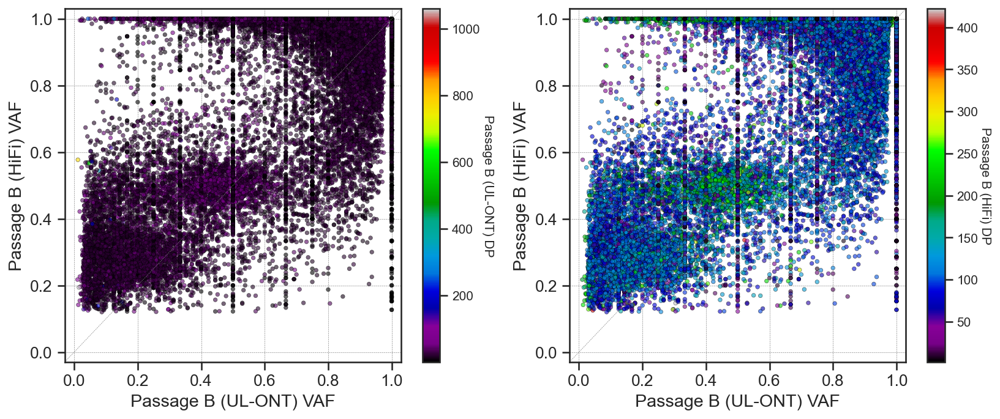

In [92]:
fig, ax = plt.subplots(1,2, figsize=(13,5))

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage B (UL-ONT) DP",
                palette='nipy_spectral', 
                s=10,
                alpha=0.6,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], 
                ax=ax[0])

ax[0].set_xlim(-0.03, 1.03)
ax[0].set_ylim(-0.03, 1.03)
ax[0].grid(True, which='both', color='grey', linestyle='--', linewidth=0.3)
ax[0].axline((0, 0), slope=1, linestyle='--', linewidth=0.3, color='grey')

norm1 = plt.Normalize(SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"]["Passage B (UL-ONT) DP"].min(), SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"]["Passage B (UL-ONT) DP"].max())
sm1 = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm1)
sm1.set_array([])

ax[0].get_legend().remove()

cbar1 = fig.colorbar(sm1, ax=ax[0])
cbar1.set_label('Passage B (UL-ONT) DP', fontsize=10, rotation=270, labelpad=10)
cbar1.ax.tick_params(labelsize=10)

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage B (HiFi) DP",
                palette='nipy_spectral', 
                s=10,
                alpha=0.6,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"], 
                ax=ax[1])

ax[1].set_xlim(-0.03, 1.03)
ax[1].set_ylim(-0.03, 1.03)
ax[1].grid(True, which='both', color='grey', linestyle='--', linewidth=0.3)
ax[1].axline((0, 0), slope=1, linestyle='--', linewidth=0.3, color='grey')

norm2 = plt.Normalize(SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"]["Passage B (HiFi) DP"].min(), SNV_VAF_Combined[SNV_VAF_Combined['Category'] != "A Specific"]["Passage B (HiFi) DP"].max())
sm2 = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm2)
sm2.set_array([])

ax[1].get_legend().remove()

cbar2 = fig.colorbar(sm2, ax=ax[1])
cbar2.set_label('Passage B (HiFi) DP', fontsize=10, rotation=270, labelpad=10)
cbar2.ax.tick_params(labelsize=10)

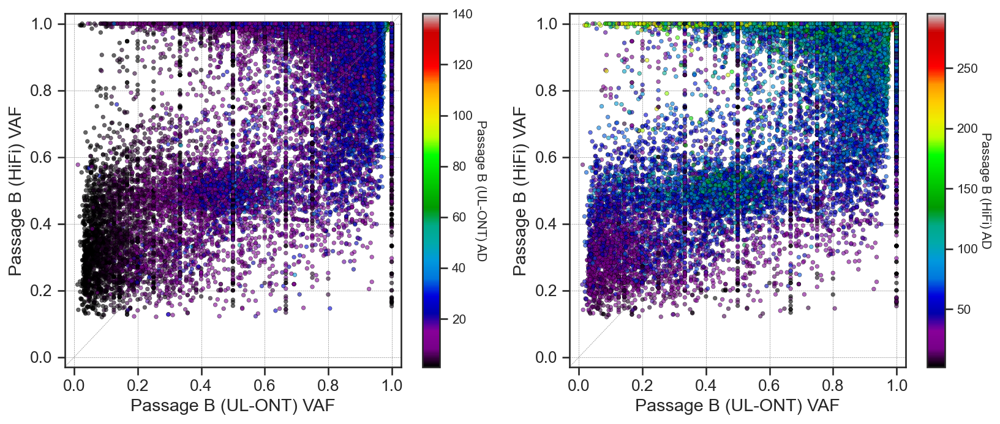

In [93]:
fig, ax = plt.subplots(1,2, figsize=(13,5))

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage B (UL-ONT) AD",
                palette='nipy_spectral', 
                s=10,
                alpha=0.6,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"], 
                ax=ax[0])

ax[0].set_xlim(-0.03, 1.03)
ax[0].set_ylim(-0.03, 1.03)
ax[0].grid(True, which='both', color='grey', linestyle='--', linewidth=0.3)
ax[0].axline((0, 0), slope=1, linestyle='--', linewidth=0.3, color='grey')

norm1 = plt.Normalize(SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"]["Passage B (UL-ONT) AD"].min(), SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"]["Passage B (UL-ONT) AD"].max())
sm1 = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm1)
sm1.set_array([])

ax[0].get_legend().remove()

cbar1 = fig.colorbar(sm1, ax=ax[0])
cbar1.set_label('Passage B (UL-ONT) AD', fontsize=10, rotation=270, labelpad=10)
cbar1.ax.tick_params(labelsize=10)

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage B (HiFi) AD",
                palette='nipy_spectral', 
                s=10,
                alpha=0.6,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"], 
                ax=ax[1])

ax[1].set_xlim(-0.03, 1.03)
ax[1].set_ylim(-0.03, 1.03)
ax[1].grid(True, which='both', color='grey', linestyle='--', linewidth=0.3)
ax[1].axline((0, 0), slope=1, linestyle='--', linewidth=0.3, color='grey')

norm2 = plt.Normalize(SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"]["Passage B (HiFi) AD"].min(), SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"]["Passage B (HiFi) AD"].max())
sm2 = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm2)
sm2.set_array([])

ax[1].get_legend().remove()

cbar2 = fig.colorbar(sm2, ax=ax[1])
cbar2.set_label('Passage B (HiFi) AD', fontsize=10, rotation=270, labelpad=10)
cbar2.ax.tick_params(labelsize=10)

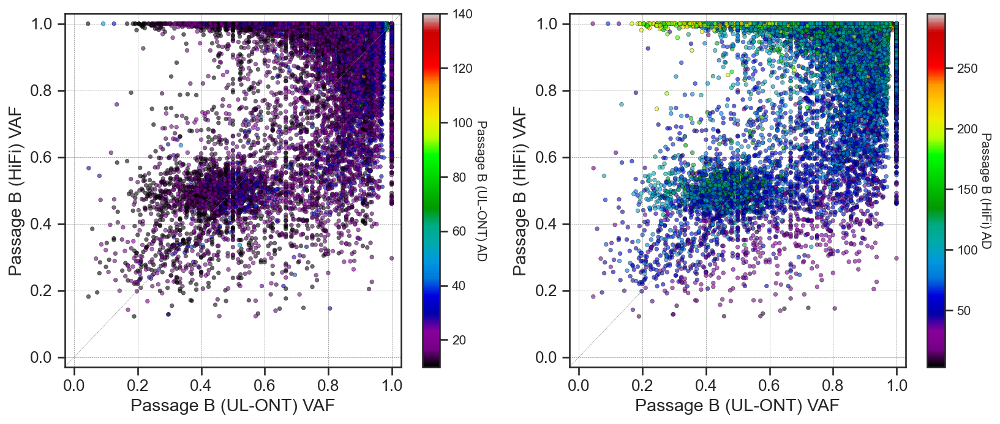

In [94]:
fig, ax = plt.subplots(1,2, figsize=(13,5))

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage B (UL-ONT) AD",
                palette='nipy_spectral', 
                s=10,
                alpha=0.6,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") & (SNV_VAF_Combined['Passage B (UL-ONT) AD'] >=10)], 
                ax=ax[0])

ax[0].set_xlim(-0.03, 1.03)
ax[0].set_ylim(-0.03, 1.03)
ax[0].grid(True, which='both', color='grey', linestyle='--', linewidth=0.3)
ax[0].axline((0, 0), slope=1, linestyle='--', linewidth=0.3, color='grey')

norm1 = plt.Normalize(SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") & (SNV_VAF_Combined['Passage B (UL-ONT) AD'] >=10)]["Passage B (UL-ONT) AD"].min(), SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") & (SNV_VAF_Combined['Passage B (UL-ONT) AD'] >=10)]["Passage B (UL-ONT) AD"].max())
sm1 = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm1)
sm1.set_array([])

ax[0].get_legend().remove()

cbar1 = fig.colorbar(sm1, ax=ax[0])
cbar1.set_label('Passage B (UL-ONT) AD', fontsize=10, rotation=270, labelpad=10)
cbar1.ax.tick_params(labelsize=10)

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage B (HiFi) AD",
                palette='nipy_spectral', 
                s=10,
                alpha=0.6,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") & (SNV_VAF_Combined['Passage B (UL-ONT) AD'] >=10)], 
                ax=ax[1])

ax[1].set_xlim(-0.03, 1.03)
ax[1].set_ylim(-0.03, 1.03)
ax[1].grid(True, which='both', color='grey', linestyle='--', linewidth=0.3)
ax[1].axline((0, 0), slope=1, linestyle='--', linewidth=0.3, color='grey')

norm2 = plt.Normalize(SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") & (SNV_VAF_Combined['Passage B (UL-ONT) AD'] >=10)]["Passage B (HiFi) AD"].min(), SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") & (SNV_VAF_Combined['Passage B (UL-ONT) AD'] >=10)]["Passage B (HiFi) AD"].max())
sm2 = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm2)
sm2.set_array([])

ax[1].get_legend().remove()

cbar2 = fig.colorbar(sm2, ax=ax[1])
cbar2.set_label('Passage B (HiFi) AD', fontsize=10, rotation=270, labelpad=10)
cbar2.ax.tick_params(labelsize=10)

<Axes: xlabel='Passage A (HiFi) AD', ylabel='Count'>

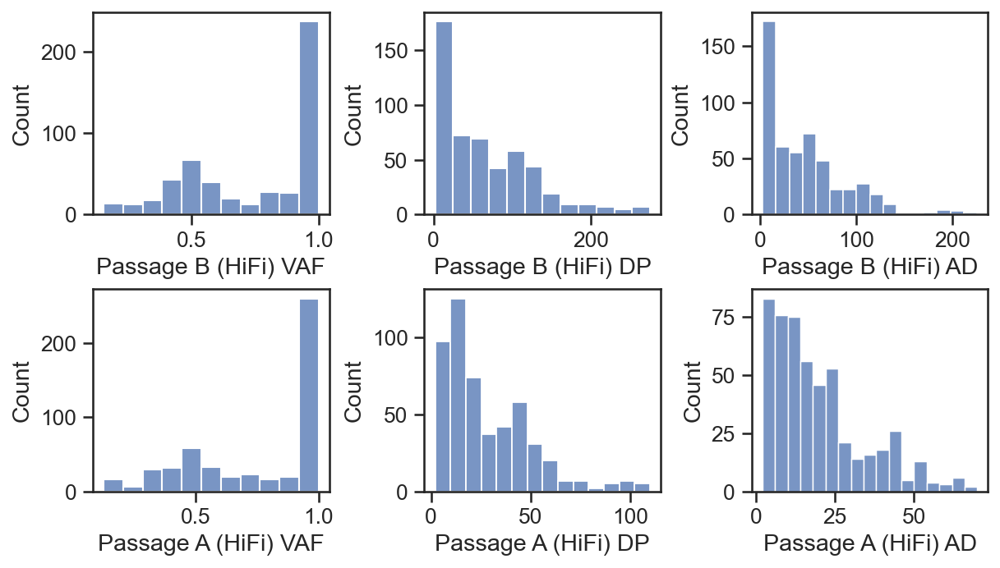

In [95]:
# 사라지는 variant들이 A에서 DP가 높다!!!! (CNV deleted site!?!?)
fig, ax = plt.subplots(2,3, figsize=(8, 4.5), constrained_layout=True)

sns.histplot(data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") &
                                   (SNV_VAF_Combined['Passage B (UL-ONT) VAF'] == 0.5)], x="Passage B (HiFi) VAF",
                                   ax=ax[0,0])
sns.histplot(data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") &
                                   (SNV_VAF_Combined['Passage B (UL-ONT) VAF'] == 0.5)], x="Passage B (HiFi) DP",
                                   ax=ax[0,1])
sns.histplot(data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") &
                                   (SNV_VAF_Combined['Passage B (UL-ONT) VAF'] == 0.5)], x="Passage B (HiFi) AD",
                                   ax=ax[0,2])
sns.histplot(data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") &
                                   (SNV_VAF_Combined['Passage B (UL-ONT) VAF'] == 0.5)], x="Passage A (HiFi) VAF",
                                   ax=ax[1,0])
sns.histplot(data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") &
                                   (SNV_VAF_Combined['Passage B (UL-ONT) VAF'] == 0.5)], x="Passage A (HiFi) DP",
                                   ax=ax[1,1])
sns.histplot(data=SNV_VAF_Combined[(SNV_VAF_Combined['Category'] == "Shared") &
                                   (SNV_VAF_Combined['Passage B (UL-ONT) VAF'] == 0.5)], x="Passage A (HiFi) AD",
                                   ax=ax[1,2])

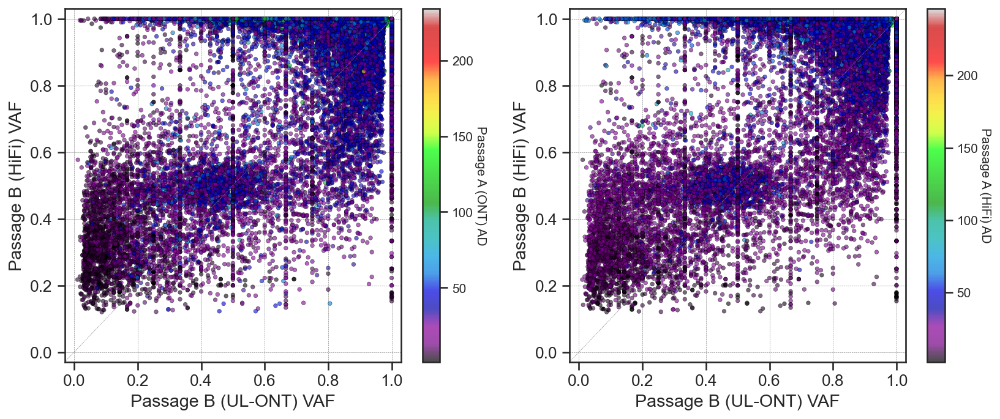

In [96]:
fig, ax = plt.subplots(1,2, figsize=(13,5))

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage A (ONT) AD",
                palette='nipy_spectral', 
                s=10,
                alpha=0.6,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"], 
                ax=ax[0])

ax[0].set_xlim(-0.03, 1.03)
ax[0].set_ylim(-0.03, 1.03)
ax[0].grid(True, which='both', color='grey', linestyle='--', linewidth=0.3)
ax[0].axline((0, 0), slope=1, linestyle='--', linewidth=0.3, color='grey')

norm1 = plt.Normalize(SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"]["Passage A (ONT) AD"].min(), SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"]["Passage A (ONT) AD"].max())
sm1 = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm1)
sm1.set_array([])

ax[0].get_legend().remove()

cbar1 = fig.colorbar(sm1, alpha=0.7, ax=ax[0])
cbar1.set_label('Passage A (ONT) AD', fontsize=10, rotation=270, labelpad=10)
cbar1.ax.tick_params(labelsize=10)

sns.scatterplot(x="Passage B (UL-ONT) VAF", 
                y="Passage B (HiFi) VAF", 
                hue="Passage A (HiFi) AD",
                palette='nipy_spectral', 
                s=10,
                alpha=0.6,
                edgecolor='black', 
                linewidth=0.3,
                data=SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"], 
                ax=ax[1])

ax[1].set_xlim(-0.03, 1.03)
ax[1].set_ylim(-0.03, 1.03)
ax[1].grid(True, which='both', color='grey', linestyle='--', linewidth=0.3)
ax[1].axline((0, 0), slope=1, linestyle='--', linewidth=0.3, color='grey')

norm2 = plt.Normalize(SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"]["Passage A (HiFi) AD"].min(), SNV_VAF_Combined[SNV_VAF_Combined['Category'] == "Shared"]["Passage A (HiFi) AD"].max())
sm2 = plt.cm.ScalarMappable(cmap="nipy_spectral", norm=norm2)
sm2.set_array([])

ax[1].get_legend().remove()

cbar2 = fig.colorbar(sm2, alpha=0.7, ax=ax[1])
cbar2.set_label('Passage A (HiFi) AD', fontsize=10, rotation=270, labelpad=10)
cbar2.ax.tick_params(labelsize=10)

## Double Base Substitution (DBS)

In [97]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt.groupby("CHROM")['POS'].diff() == 1].shape
colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt.groupby("CHROM")['POS'].diff() == 1].shape


(1097, 13)

In [98]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt.groupby("CHROM")['POS'].diff().shift(-1) == 1]

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829T_PassageB_DSA,SNVid,Flagger,NucFreq
116,haplotype1-0000001,12676856,.,C,T,42.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:9:117:23,94:0.803419:41,0,8",haplotype1-0000001_12676856_C_T,Hap,NaN
219,haplotype1-0000001,28039722,.,G,T,65.2,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:50:112:0,112:1:65,50,0",haplotype1-0000001_28039722_G_T,Hap,NaN
233,haplotype1-0000001,29598398,.,C,T,63,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:56:59:0,59:1:63,57,0",haplotype1-0000001_29598398_C_T,Hap,NaN
259,haplotype1-0000001,35267979,.,G,A,66.5,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:56:93:0,93:1:66,56,0",haplotype1-0000001_35267979_G_A,Hap,NaN
274,haplotype1-0000001,39873419,.,C,T,64,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:58:69:0,69:1:64,59,0",haplotype1-0000001_39873419_C_T,Hap,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58069,haplotype2-0000079,152890009,.,C,T,60.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:59:64:0,64:1:60,64,0",haplotype2-0000079_152890009_C_T,Hap,NaN
58083,haplotype2-0000079,154873265,.,G,A,18.5,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:19:43:35,8:0.186047:18,0,44",haplotype2-0000079_154873265_G_A,Hap,NaN
58124,haplotype2-0000079,161251107,.,C,T,53.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:42:58:9,49:0.844828:53,0,42",haplotype2-0000079_161251107_C_T,Hap,NaN
58207,haplotype2-0000079,171322181,.,G,A,60.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:55:57:0,57:1:60,56,0",haplotype2-0000079_171322181_G_A,Hap,NaN
